In [1]:
%load_ext autoreload
%autoreload 2

import time
import numpy as np

# Constants

In [2]:
sample_rate = 44100
hop_size = 441*2
hidden_mod = 3
maximum = 32
width = 4
ds_path = './datasets/VN/ds.pkl'
model_path = './models/VN/model05_'

# Data Class

In [3]:
import os
import re
import json
import math
import cv2
import subprocess as sp
from osr2mp4.EEnum.EReplay import Replays
from osr2mp4.osr2mp4 import Osr2mp4
import torch
import torchvision.io as vision
import torchvision.transforms as transforms

In [4]:
class OSR():
    def __init__(self, beatmap_dir, beatmap, sample_rate=44100, hop_size=441, hidden=False,
                 width=4,
                 tmp='./tmp', vtmp='./vid', atmp='./wav'):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.beatmap_path = os.path.join(self.beatmap_dir, self.beatmap)
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.rate = int(sample_rate / hop_size)
        self.fps = self.rate
        self.tmp = tmp
        self.vtmp = vtmp
        self.atmp = atmp
        self.width = 4
        self.hidden = hidden
        self.data_json = os.path.join(self.tmp, self.beatmap + '.json')
        hdn = 'hdn' if hidden else ''
        self.video_path = os.path.join(self.vtmp, self.beatmap + hdn + '.avi')
        
        self.replay_info = None
        self.osr2mp4 = None
        self.video = None
        self.hitobjects = None
        self.cursorstream = None
        self.timestamp = None
                
    def run_osr2mp4(self):
        d = json.load(open('data.json', 'r'))
        f = open(self.data_json, 'w')
        d['Beatmap path'] = self.beatmap_path
        if self.hidden is False:
            d['Skin path'] = './skin'
        else:
            d['Skin path'] = './skin_hidden'
        d['FPS'] = self.fps
        d['Output path'] = self.video_path
        json.dump(d, f)
        f.close()
                 
        self.osr2mp4 = Osr2mp4(filedata=self.data_json, filesettings='settings.json', filepp='ppsettings.json', 
                               filestrain='strainsettings.json', logtofile=True)
        while True:
            if self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_X] == 0 and self.osr2mp4.replay_info.play_data[-1][Replays.CURSOR_Y] == 0:
                self.osr2mp4.replay_info.play_data = self.osr2mp4.replay_info.play_data[0:-1]
            else:
                break
        
    def create_vid(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        cmd = ['python', 'create_vid.py', self.data_json]
        proc = sp.Popen(cmd)
        proc.wait()
        
    def parse_timings(self):
        if self.video is None:
            self.get_video()
        self.beat_len = []
        self.timestamp = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'BeatDivisor.*', l):
                self.BeatDivisor = int(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0]))
        self.timestamp.append(int(self.video[1].shape[1] / self.video[2]['audio_fps'] * 1000))
        f.close()
    
    def parse_hitobjects(self):
        self.hitobjects = []
        f = open(self.beatmap_path)
        for l in f:
            if re.match(r'ApproachRate.*', l):
                AR = float(l.split(':')[1])
                if AR < 5.0:
                    preempt = 1200 + 600 * (5 - AR) / 5
                    fadein = 800 + 400 * (5 - AR) / 5
                else:
                    preempt = 1200 - 750 * (AR - 5) / 5
                    fadein = 800 - 500 * (AR - 5) / 5
                self.preempt = preempt - fadein*0.1
                break
        f.seek(0)
        for l in f:
            if re.match(r'SliderMultiplier.*', l):
                self.sliderMultiplier = float(l.split(':')[1])
                break
        f.seek(0)
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
    
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
        
    def create_cursor_peak(self, y, i):
        alen = len(y)
        w = self.width/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j][Replays.KEYS_PRESSED] = max(y[i+j][Replays.KEYS_PRESSED], f, 0)
            j += 1
    
    def process_beatobjects(self):
        pass
    
    def process_hitobjects(self):
        if self.hitobjects is None:
               self.parse_beatmap()
        self.hitobjStream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
    
    def process_clicks(self):
        pass
    
    def process_cursor(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        n = math.ceil((self.osr2mp4.replay_info.play_data[-1][Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)
        self.cursorstream = [None] * n
        #self.cursorstream = np.zeros((n, 3))
        
        for j in range(len(self.osr2mp4.replay_info.play_data) - 1):
            a = self.osr2mp4.replay_info.play_data[j]
            b = self.osr2mp4.replay_info.play_data[j+1]
            delta = (b[Replays.TIMES] - a[Replays.TIMES]) * 0.001 * self.fps
            xdist = b[Replays.CURSOR_X] - a[Replays.CURSOR_X]
            ydist = b[Replays.CURSOR_Y] - a[Replays.CURSOR_Y]
            stime = (a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps
            x = a[Replays.CURSOR_X]
            y = a[Replays.CURSOR_Y]
            
            e = np.array([0.0, 0.0, 0])
            if self.hidden is False:
                for t in range(math.ceil(delta)):
                    e[Replays.CURSOR_X] = x + xdist/delta*t
                    e[Replays.CURSOR_Y] = y + ydist/delta*t
                    self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
            else:
                def f(x, dist):
                    if dist == 0:
                        return x
                    c = 20
                    o = dist/2
                    return o*2 * 1 / (1 + math.exp(-1 * c * (x - o) / o))
                for t in range(math.ceil(delta)):
                    e[Replays.CURSOR_X] = x + f(xdist/delta*t, xdist)
                    e[Replays.CURSOR_Y] = y + f(ydist/delta*t, ydist)
                    self.cursorstream[int(stime + t)] = torch.tensor(e, dtype=torch.float)
                
            e[Replays.KEYS_PRESSED] = a[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = a[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = a[Replays.CURSOR_Y]
            self.cursorstream[int((a[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
            e[Replays.KEYS_PRESSED] = b[Replays.KEYS_PRESSED]
            e[Replays.CURSOR_X] = b[Replays.CURSOR_X]
            e[Replays.CURSOR_Y] = b[Replays.CURSOR_Y]
            self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
        
    def process_events(self):
        self.process_clicks()
        self.process_cursor()
        
    def read_video(self, scale=1):
        if not os.path.exists(self.video_path):
            self.create_vid()
        #self.video = vision.read_video(self.video_path)
        transform = transforms.ToTensor()
        frames = []
        vc = cv2.VideoCapture(self.video_path)
        while True:
            r, f = vc.read()
            f = cv2.resize(f, (0,0), fx=scale, fy=scale)
            frames.append(transform(f))
            if r is False:
                break
        return torch.stack(frames)
        
    def queue_vid(self):
        if not os.path.exists(self.video_path):
            self.create_vid()   
        return self.video_path
    
    def get_offset(self):
        if self.osr2mp4 is None:
            self.run_osr2mp4()
        return self.osr2mp4.replay_info.play_data[0][Replays.TIMES]
    
    def get_beatobjects(self):
        if self.beatobjStream is None:
            self.process_beatobjects()
        stream = [None] * len(self.beatobjStream)
        for i in range(len(self.beatobjStream)):
            if self.beatobjStream[i] == [] or self.beatobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.beatobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
        
    def get_hitobjects(self):
        if self.hitobjStream is None:
            self.process_hitobjects()
        stream = [None] * len(self.hitobjStream)
        for i in range(len(self.hitobjStream)):
            if self.hitobjStream[i] == [] or self.hitobjStream == None:
                h = np.array([0], dtype=np.float32)
            else:
                h = np.array(self.hitobjStream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
    
    def get_cursor(self):
        if self.cursorstream is None:
            self.process_events()
        return torch.stack(self.cursorstream)
        
    def get_video(self, scale=1):
        if self.video is None:
            self.read_video(scale=1)
        return self.video

# Dataset

In [5]:
import glob
import copy
import traceback
import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
import cv2
import matplotlib.pyplot as plt

In [6]:
class OSR_Dataset(Dataset):
    def __init__(self, beatmap_dir, sample_rate=44100, hop_size=441, seq_dur=10, scale=1, hidden_mod=0, maximum=100):
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.hidden_mod = hidden_mod
        self.maximum = maximum
        self.scale = scale
        
        self.osrs = []
        
        if beatmap_dir is None:
            self.v = []
            self.c = []
            return
        
        j = 0
        def parse_beatmaps(j):
            for r, dirs, _ in os.walk(beatmap_dir):
                for dir in dirs:
                    for root, _, files in os.walk(os.path.join(r, dir)):
                        for f in files:
                            if re.match(r'.*osu$', f):
                                if self.hidden_mod == 0 or j % self.hidden_mod != 0:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size))
                                else:
                                    self.osrs.append(OSR(root, f, sample_rate=sample_rate, hop_size=hop_size, hidden=True))
                                if j == self.maximum:
                                    return j
                                j += 1
            return j
        j = parse_beatmaps(j)
        
        self.v = [None] * j
        self.c = [None] * j
        
        def process(i):
            m = self.osrs[i]
            self.osrs[i] = None;
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)
                self.v[i] = copy.deepcopy(m.queue_vid())
                self.c[i] = copy.deepcopy(m.get_cursor())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)
                self.v[i] = None
                self.c[i] = None
            del m
        
        list(map(process, range(j)))
        
        self.v = list(filter(lambda x: x is not None, self.v))
        self.c = list(filter(lambda x: x is not None, self.c))
        
    def take(self, ds, i, j):
        self.v = ds.v[i:j]
        self.c = ds.c[i:j]

    def __len__(self):
        return len(self.v)

    def __getitem__(self, i):
        if self.seq_len == 0:
            return None
        
        transform = transforms.ToTensor()
        j = np.random.randint(0, self.c[i].shape[0] - self.seq_len)
        vc = cv2.VideoCapture(self.v[i])
        vc.set(cv2.CAP_PROP_POS_FRAMES, j)
        #for k in range(j):
        #    _, _ = vc.read()
        
        f = [None] * self.seq_len
        for k in range(self.seq_len):
            frame = vc.read()[1]
            frame = cv2.resize(frame, (0,0), fx=self.scale, fy=self.scale)
            f[k] = transform(frame)
        
        c = self.c[i][j: j+self.seq_len]
        cy = torch.div(c[:,Replays.CURSOR_Y], 384) #, dtype=c.type())
        c[:,1] = torch.div(c[:,Replays.CURSOR_X], 512) #, dtype=c.type())
        c[:,0] = cy
        
        return (torch.stack(f), c) #self.c[i][j: j+self.seq_len])

# Testing

In [7]:
s = OSR_Dataset('../ex/beatmaps', sample_rate=44100, hop_size=441*2, hidden_mod=0, maximum=1)

0/0 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu


(600, 1024, 3)
tensor(0.5409) tensor(0.5290)
(263, 158)


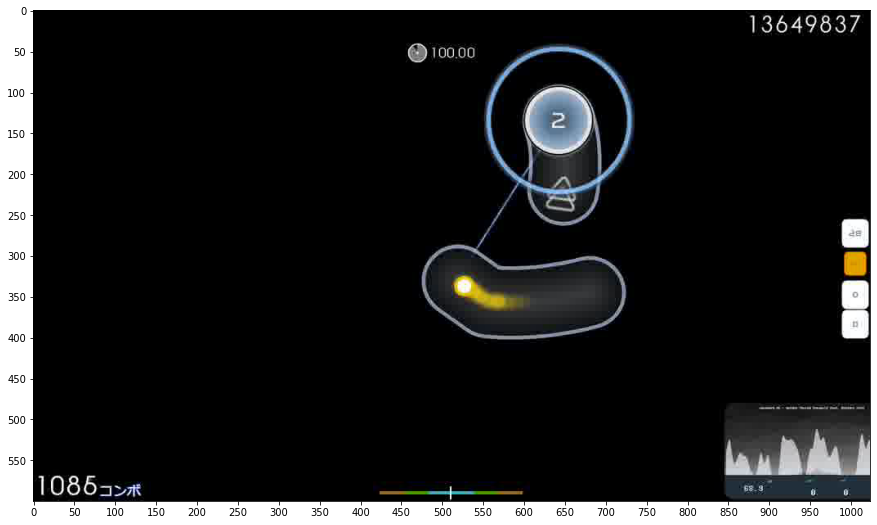

In [19]:
import matplotlib.pyplot as plt

import op

op.h = 600 / 2
op.w = 1024 / 2
op.calratio()

e = s[0]
print(e[0][0].permute(1, 2, 0).numpy().shape)

plt.rcParams["figure.figsize"] = (15, 15)

plt.xticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[1], 50))
plt.yticks(np.arange(0, e[0][0].permute(1, 2, 0).numpy().shape[0], 50))

plt.imshow(cv2.cvtColor(e[0][0].permute(1, 2, 0).numpy(), cv2.COLOR_BGR2RGB))
print(e[1][0][1], e[1][0][0])
print(op.cor(e[1][0][1] * 512, e[1][0][0] * 384))
#print(op.cor(e[1][0][1], e[1][0][0]))
#for x in e[1][0:10]:
    #print(op.cor(x[0], x[1]))

# Process Data

In [7]:
import time

In [7]:
ds = OSR_Dataset('../beatmaps', sample_rate=sample_rate, hop_size=hop_size, hidden_mod=1, maximum=256)

0/255 Chata - Engage (Lasse) [Insane].osu
1/255 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
2/255 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/255 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/255 StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
5/255 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/255 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/255 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/255 fripSide - future gazer (TV Size) (alacat) [Insane].osu
9/255 cYsmix - bells! (Gero) [normal!].osu
10/255 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
11/255 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu
12/255 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
13/255 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu
14/255 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu
15/255 Narushi

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 7482 in argument 0, but got NoneType


pruning: Fujijo Seitokai Shikkou-bu - Best FriendS (sahuang) [N a s y a's Insane].osu
60/255 Omoi - Chiisana Koi no Uta (Synth Rock Cover) (val0108) [Marianna's Insane].osu
61/255 Natsumi Kiyoura - Tabi no Tochuu (Weinmagier) [Normal].osu
62/255 Nico Nico Douga - U.Nknown Goose (Borokuzu) [Insane].osu
63/255 Hatsune Miku - Moon (Saten ruiko) [Insane].osu
64/255 fripSide - black bullet (TV Size) (Chloe) [Insane].osu
65/255 Hatsune Miku - the last effect (Holoaz) [ringloid].osu
66/255 Gojou Kai - Touhou Youkai Komachi (James) [Normal].osu
67/255 REOL - Hibikase (Gero) [NiNo's Insane].osu
68/255 Kuba Oms - My Love (W h i t e) [Insane].osu
69/255 Yasuo - P - Electric Angel (- Ruby Rose -) [Insane].osu
70/255 Shimotsuki Haruka, Suzuyu - Fairy Wreath (ImpurePug) [Angraecum].osu
71/255 ClariS - Connect (TV Size) (browiec) [Mathew's Insane].osu
72/255 DIVELA feat. Hatsune Miku - BEAT SYNCER (Log Off Now) [Insane].osu
73/255 The Quick Brown Fox - The Big Black (Blue Dragon) [WHO'S AFRAID OF THE

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 6527 in argument 0, but got NoneType


75/255 toby fox - Nyeh Heh Heh! & Bonetrousle (DaxMasterix) [NORMAL].osu
76/255 ryo (supercell) - ODDS&ENDS (Short Ver.) (Betsuto) [Insane].osu
77/255 TRakker - Trail of Dust (Amamiya Yuko) [Trail of Star].osu
78/255 Police Piccadilly feat. Hatsune Miku - Kire Carry On (Sinnoh) [negusver's Insane].osu
79/255 MOSAIC.WAV - Zen Sekai Teki Touch Panel (Laurier) [CrystLer].osu
80/255 Aiobahn & Yunomi - Makuramoto ni Ghost (feat. Nicamoq) (Swan) [Swan's Melanzana].osu
81/255 Camellia - Routing (Shiirn) [pishi's Advanced].osu
82/255 seleP feat. Lily - Chloe-Five Decades Ago- (Duftende Pizza) [V].osu
83/255 dj TAKA - quaver (Monstrata) [Haru's Insane].osu
84/255 Silver Forest Feat. Aki & Sakura Mayuko - Summer time Heaven -after (RVMathew) [Ojou].osu
85/255 Van Darkholme - GachiMuchi circulation (Kr0n0s23) [Thank you, sir!].osu
86/255 Ariabl'eyeS - Senkou no Furea (Kibbleru) [Redemption].osu
87/255 ATeens - Gimme! Gimme! Gimme! (Nightcore Mix) (ShadowSoul) [Gimme!].osu
88/255 Tomoe Tamiyasu - 

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 241, in get_cursor
    return torch.stack(self.cursorstream)
TypeError: expected Tensor as element 512 in argument 0, but got NoneType


pruning: Tomoe Tamiyasu - Yamato Nadeshiko Hanakotoba (Lasse) [Insane].osu
89/255 Masayoshi Minoshima ft. nomico - Bad Apple!! (Ephemeral) [Normal].osu
90/255 solfa feat. Shimotsuki Haruka - Natsuiro Ramune (Lasse) [Bariton's Insane].osu
91/255 Nakagawa Shouko - Sorairo Days (Rizen) [Fizz's Insane].osu
92/255 LeaF - Calamity Fortune (Arphimigon) [BOOM].osu
93/255 cillia - Fairytale, (SkinnyJommy) [Pho's Insane].osu
94/255 Lindsey Stirling - Senbonzakura (MrSergio) [Insane].osu
95/255 Hatsune Miku - Senkouhanabi Aika (val0108) [Insane].osu
96/255 Hatsune Miku - Himitsu Keisatsu (Lalarun) [Insane].osu
97/255 MISATO - Necro Fantasia (WORSTPOLACKEU) [Cheesecake's Insane].osu
98/255 a_hisa - Cheshire,s dance (Muya) [Normal].osu
99/255 Roselia - The Everlasting Guilty Crown (Underdogs) [Insane].osu
100/255 40meter-P - Mousou sketch (Noways) [Insane!].osu
101/255 sasakure.UK x DECO27 - 39 (Finshie) [Insane].osu
102/255 Chata - len (Cami) [xiqingwa's Lunatic].osu
103/255 Fractal Dreamers - Fat

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


121/255 Sawai Miku - Colorful. (Asterisk DnB Remix) (Asfand) [Vibrant].osu
122/255 Yunomi & nicamoq - Indoor Kei Nara Trackmaker (dipperbee) [TrAcK MaKeR].osu
123/255 GTA feat. Sam Bruno - Red Lips (Mendus Remix) (Euny) [Natsu's Insane].osu
124/255 TrySail - Utsuroi (Short Ver.) (Log Off Now) [Nexus' Insane].osu
125/255 ZAQ - Seven Doors (eINess) [wkyik's Insane].osu
126/255 M2U - Stellar (Ultima Fox) [defiance's Insane].osu
127/255 SawanoHiroyuki[nZk]mizuki - aLIEz (jonathanlfj) [Trust's Normal].osu
128/255 YOASOBI - Yoru ni Kakeru (Petal) [Keirelia's Insane].osu
129/255 Usada Pekora - Discommunication Alien (Yugu) [XLT's Insane].osu
130/255 EastNewSound - Sadistic Paranoia (TicClick) [Vass-RJ's Hard].osu
131/255 Sound Souler - Paradise (kwk) [Mir's Insane].osu
132/255 Hatsune Miku - Subarashii Sekai (val0108) [Insane].osu
133/255 AAAA - carnation (Veridian) [noffy's normal].osu
134/255 Kamogawa rokkaazu (CVKubota Kaoru) - STONES (Pata-Mon) [GDInsane [placeholder]].osu
135/255 UNISON 

Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


175/255 petit milady - Koi wa Milk Tea (Okoratu) [Normal].osu
176/255 Dark PHOENiX - Taketori Hishou (KanbeKotori) [Extra].osu
177/255 Mili - Origin (TV Size) (Ryuusei Aika) [kanor's Insane].osu
178/255 Hanataba - Night of Knights (v2b) [Normal].osu
179/255 Sagara Kokoro - Hoshizora no Ima (Star Stream) [Insane].osu
180/255 Hanatan - Uta ni Katachi wa Nai keredo (Asahina Momoko) [Recollection].osu
181/255 PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
pruning: PinocchioP - SLoWMoTIoN (Short Ver.)feat.Hatsune Miku (lllmtklll) [Insane].osu
182/255 Yoko Takahashi - Zankoku Na Tenshi No These (TV. Size Version) (moph) [Ambient's Insane].osu
183/255 Noboru ft. Hatsune Miku - Shiroi Yuki No Princess Wa (Hokichi) [ShiraHoki's Light Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


184/255 Chitose Sara - Arcadia (Short ver.) (Riven) [-Tochi's Insane].osu
185/255 eyemedia - Bloody Purity (tsuka) [Normal].osu
pruning: eyemedia - Bloody Purity (tsuka) [Normal].osu
186/255 Atoguru - Itoshi Kimi wo Mitsuke ni (Pizza Kun) [Insane].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


187/255 Hanasaka Yui(CV M.A.O) - Harumachi Clover (Naotoshi) [Light Insane].osu
188/255 Hatsune Miku - Ephemeral (Wishkey) [Fade Away].osu
189/255 emon - shake it! (kosiga) [Normal].osu
190/255 Suzuki Konomi - This game (TV Size) (Sekai-nyan) [Nyquill's Insane Game].osu
191/255 Warak - REANIMATE (iyasine) [xsrs's Extra].osu
192/255 Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


pruning: Noriko Mitose - The Party of Seven Witches (Kibbleru) [Dereliction].osu
193/255 Kuroneko Dungeon - Ryoushi no Umi no Lindwurm (Crystal) [ak74's Insane].osu
194/255 Feint - Reprise (Secretpipe) [Sieg's Light Insane].osu
195/255 Umetora - Ifuudoudou (Nymph) [Insane].osu
196/255 Hana - Kuukirikigaku Shoujo to Shounen no Uta (Soleily Remix) (Koiyuki) [Yuki].osu
197/255 wowaka - Unknown Mother-Goose feat. Hatsune Miku (tutuhaha) [Insane].osu
198/255 Megurine Luka - LukaLuka Night Fever (samipale) [Normal+].osu
199/255 paraoka feat. harunya & amane - Trickstar (lahphnya) [Insane].osu
200/255 Silver Forest - PORUTA ~ gaisuto no himatsubushi (Eirene) [Normal].osu
201/255 rerulili - Noushou Sakuretsu Girl (NatsumeRin) [dksslqj Style].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


pruning: rerulili - Noushou Sakuretsu Girl (NatsumeRin) [dksslqj Style].osu
202/255 Yooh - MariannE (Yogurtt) [Extra].osu
203/255 Various Artists - IIDX collection (N a s y a) [V3].osu
204/255 CHiCO with HoneyWorks - Heart no Shuchou (Sotarks) [Yuitarks' Insane].osu
205/255 Demetori - Fall of Fall ~ The Door Into Summer (jonathanlfj) [Extra Stage].osu
206/255 u's - Baby Maybe Koi no Button (Asterisk DnB Remix) (jeydude) [Love Live!].osu
207/255 ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
pruning: ALTIMA - Burst The Gravity (TV Size) (bes_joker) [Insane].osu
208/255 Chiyoko - Baby Fantastic! -Short ver.- (Zweib) [iMage's Insane].osu
209/255 Apocalyptica - Rage of Poseidon (pishifat) [Extreme].osu


Traceback (most recent call last):
  File "/tmp/ipykernel_30336/319404534.py", line 44, in process
    self.c[i] = copy.deepcopy(m.get_cursor())
  File "/tmp/ipykernel_30336/3267943912.py", line 240, in get_cursor
    self.process_events()
  File "/tmp/ipykernel_30336/3267943912.py", line 187, in process_events
    self.process_cursor()
  File "/tmp/ipykernel_30336/3267943912.py", line 183, in process_cursor
    self.cursorstream[int((b[Replays.TIMES] - self.get_offset()) * 0.001 * self.fps)] = torch.tensor(e, dtype=torch.float)
IndexError: list assignment index out of range


210/255 fripSide - snow blind -after- (Mordred) [Tears Like Snowflakes].osu
211/255 ryo (supercell) feat.Hatsune Miku - Tsumi no Namae (Monstrata) [Blooming].osu
212/255 Uehara Rena - Todokanai Koi '13 (TV EDIT) (Sellenite) [Rewrite].osu
213/255 Giga-P - LUVORATORRRRRY! (Selisi) [Insane].osu
214/255 Barbarian On The Groove feat. Takizawa Ichiru - Yoi ni Kanawazu (Shurelia) [Hard].osu
215/255 livetune feat.Hatsune Miku - Last Night, Good Night (Autumn) [Oyasumi].osu
216/255 MiddleIsland - Achromat (zxhzxhz) [Insane].osu
217/255 Tamura Yukari - MERRY MERRY MERRY MENU... Ne! (moonlightleaf) [wkyik's Insane].osu
218/255 Dreamcatcher - YOU AND I (Natsu) [Insane].osu
219/255 M2U - Dual Fractal (Hailie) [Insane].osu
220/255 EGOIST - Namae no Nai Kaibutsu (LunarSakuya) [lfj's Insane].osu
221/255 ginkiha - dawn(ginkiha hardcore remix) (Aka) [Kyubey's Insane].osu
222/255 seleP - Remember me (Avishay) [A's Extra].osu
223/255 Kano - Stella-rium (Kowari) [Insane].osu
224/255 IOSYS - Hakurei Jinja (

In [8]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

0.0817873477935791 secs


# Load Daaset

In [7]:
ds = torch.load(ds_path)

# Model

In [8]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as nnF

from attention.attention import SpatialAttn, ProjectorBlock

In [27]:
class VN(nn.Module):
    def __init__(self, dim_in, device):
        super(VN, self).__init__()
        
        self.device = device
        self.lstmA_size = 128
        self.lstmA_layers = 2
        self.dim_out = 2

        cA = [0,0]
        W = dim_in[0]
        K = cAK = 3
        P = cAP = 1
        S = cAS = 1
        w = int(((W - K + 2*P)/S) + 1)
        k = mAk = 2
        p = mAp = 0
        s = mAs = 2
        m = int(((w - k + 2*p)/s) + 1)
        cA[0] = w
        
        W = dim_in[1]
        K = cAK
        P = cAP
        S = cAS
        w = int(((W - K + 2*P)/S) + 1)
        k = mAk
        p = mAp
        s = mAs
        m = int(((w - k + 2*p)/s) + 1)
        cA[1] = w
        
        cB = [0,0]
        W = cA[0]
        K = cBK = 3
        P = cBP = 1
        S = cBS = 1
        w = int(((W - K + 2*P)/S) + 1)
        k = mBk = 3
        p = mBp = 0
        s = mBs = 2
        m = int(((w - k + 2*p)/s) + 1)
        cB[0] = m
        
        W = cA[1]
        K = cBK
        P = cBP
        S = cBS
        w = int(((W - K + 2*P)/S) + 1)
        k = mBk
        p = mBp
        s = mBs
        m = int(((w - k + 2*p)/s) + 1)
        cB[1] = m
        
        self.convA1 = nn.Conv2d(3, 16, 3, stride=1, padding=1)
        self.convB1 = nn.Conv2d(16, 16, 3, stride=1, padding=1) 
        self.maxPB1 = nn.MaxPool2d(3, stride=2, padding=1)
        
        self.convA2 = nn.Conv2d(16, 32, 3, stride=1, padding=1)
        self.convB2 = nn.Conv2d(32, 32, 3, stride=1, padding=1) 
        self.maxPB2 = nn.MaxPool2d(3, stride=2, padding=1)

        self.convA3 = nn.Conv2d(32, 64, 3, stride=1, padding=1)
        self.convB3 = nn.Conv2d(64, 64, 3, stride=1, padding=1) 
        self.maxPB3 = nn.MaxPool2d(3, stride=2, padding=1)
        
        #self.linear1 = nn.Linear(38912, 38912)
       
        self.lstmA = nn.LSTM(38912, hidden_size=self.lstmA_size, num_layers=self.lstmA_layers,
                             batch_first=True, bidirectional=False)
        self.linearA = nn.Linear(self.lstmA_size, self.lstmA_size)
        self.linearB = nn.Linear(self.lstmA_size, 32)
        self.linearC = nn.Linear(32, self.dim_out)
        
        self.hiddenA = None
        
    def _make_layer(self, in_features, out_features, blocks, pool=False):
        layers = []
        for i in range(blocks):
            conv2d = nn.Conv2d(in_channels=in_features, out_channels=out_features, kernel_size=3, padding=1, bias=False)
            layers += [conv2d, nn.BatchNorm2d(out_features), nn.ReLU(inplace=True)]
            in_features = out_features
            if pool:
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
        return nn.Sequential(*layers)
        
    def init_hidden(self, batch_size):
        h = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        c = torch.zeros(self.lstmA_layers, batch_size, self.lstmA_size).to(self.device)
        self.hiddenA = (h, c)
 
    def forward(self, x):
        s = x.shape
        x = torch.reshape(x, (s[0] * s[1], s[2], s[3], s[4]))
        
        x = self.convA1(x)
        x = nnF.relu(x)
        x = self.convB1(x)
        x = nnF.relu(x)
        x = self.maxPB1(x)
        
        x = self.convA2(x)
        x = nnF.relu(x)
        x = self.convB2(x)
        x = nnF.relu(x)
        x = self.maxPB2(x)
        
        x = self.convA3(x)
        x = nnF.relu(x)
        x = self.convB3(x)
        x = nnF.relu(x)
        x = self.maxPB3(x)
        
        x = torch.flatten(x, start_dim=1)
        x = torch.reshape(x, (s[0], s[1], x.shape[-1]))
        
        #x = self.linear1(x)
        
        x, self.hiddenA = self.lstmA(x, self.hiddenA)
        x = self.linearA(x)
        x = nnF.relu(x)
        x = self.linearB(x)
        x = nnF.relu(x)
        x = self.linearC(x)
        
        return x

# Training

In [28]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt
import op

In [29]:
batch_size = 1
scale = 1/4
dim_in = (int(600 * scale), int(1024 * scale))
seq_dur = 2

In [30]:
device = torch.device('cuda')

In [31]:
epoch_cum = 0
val_hist = []
train_hist = []
vn = VN(dim_in=dim_in, device=device)
vn.to(device)

VN(
  (convA1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convB1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convA2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convB2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convA3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convB3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (lstmA): LSTM(38912, 128, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=128, out_features=128, bias=True)
  (linearB): Linear(in_features=128, out_features=32, bias=True)
  (linearC): Linear(in_features=32, out_features=2, bias=True)
)

In [32]:
vn.init_hidden(1)
summary(vn, input_size=(1, 1, 3, dim_in[0], dim_in[1]), col_width=16,
           col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
VN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 3, 150, 256] [1, 16, 150, 256] 448              [3, 16, 3, 3]    17,203,200
├─Conv2d: 1-2                            [1, 16, 150, 256] [1, 16, 150, 256] 2,320            [16, 16, 3, 3]   89,088,000
├─MaxPool2d: 1-3                         [1, 16, 150, 256] [1, 16, 75, 128] --               --               --
├─Conv2d: 1-4                            [1, 16, 75, 128] [1, 32, 75, 128] 4,640            [16, 32, 3, 3]   44,544,000
├─Conv2d: 1-5                            [1, 32, 75, 128] [1, 32, 75, 128] 9,248            [32, 32, 3, 3]   88,780,800
├─MaxPool2d: 1-6                         [1, 32, 75, 128] [1, 32, 38, 64]  --               --               --
├─Conv2d: 1-7                            [1, 32, 38, 64]  [1,

In [17]:
train_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)
val_ds = OSR_Dataset(None, sample_rate=sample_rate, hop_size=hop_size, seq_dur=seq_dur, scale=scale, hidden_mod=hidden_mod, maximum=maximum)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=1, prefetch_factor=2)

In [18]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(vn.parameters(), lr=0.001)

In [19]:
op.h = dim_in[0]
op.w = dim_in[1]
op.calratio()

def trainVN():
    global epoch_cum, lamb
    global v, c, PV, pv, g, gt, MP, MC

    for epoch in range(epochs):
        vn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for v, c in info:
        #for v, c in train_ldr:
            V, C = v.to(device), c.to(device)
            
            optimizer.zero_grad()
            vn.init_hidden(v.shape[0])
            PV = vn(V)

            loss = criterion(PV, C[:,:,:2])
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        vn.eval()
        torch.no_grad()
        val_loss = 0
        for v, c in val_ldr:
            V, C = v.to(device), c.to(device)

            vn.init_hidden(v.shape[0])
            PV = vn(V)
            
            loss = criterion(PV, C[:,:,:2])
            val_loss += loss.item()

        print(epoch+epoch_cum, 'of', epochs+epoch_cum)

        plt.rcParams["figure.figsize"] = (15, 5)
        plt.figure()
        _, p = plt.subplots(1, 3)
        
        e = v[0][10].permute(1, 2, 0).numpy()
        g = c[0][10][:2]
        print('pred:', float(PV[0][0][1]), float(PV[0][0][0]))
        print('gt:', float(g[1]), float(g[0]))
        print(op.cor(g[1] * 512, g[0] * 384))
        p[0].imshow(cv2.cvtColor(e, cv2.COLOR_BGR2RGB))
        
        pv = PV[0].cpu().detach().numpy().transpose(1, 0)
        p[1].plot(pv[1], pv[0])
        gt = c[0].permute(1, 0).numpy()
        p[1].plot(gt[1], gt[0])
        
        train_loss = train_loss/len(train_ldr)
        val_loss = val_loss/len(val_ldr)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        p[2].plot(train_hist)
        p[2].plot(val_hist)
        
        plt.show()

    epoch_cum += epochs

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.45it/s  0.0210                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 24
pred: 0.27284589409828186 0.3276500105857849
gt: 0.5175751447677612 0.4999995529651642
(128, 76)


<Figure size 1080x360 with 0 Axes>

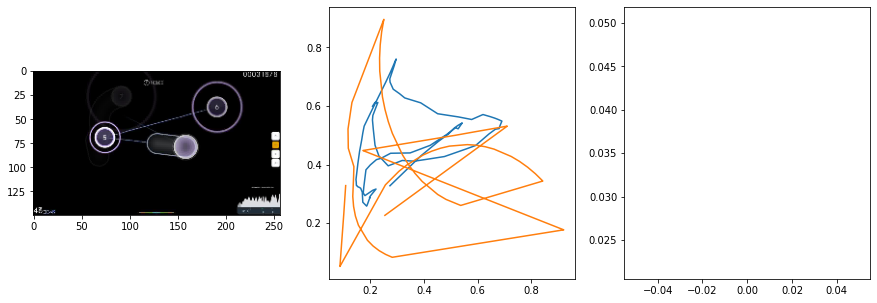

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.39it/s  0.0141                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 24
pred: 0.24237996339797974 0.2618142366409302
gt: 0.3061596155166626 0.268519788980484
(95, 49)


<Figure size 1080x360 with 0 Axes>

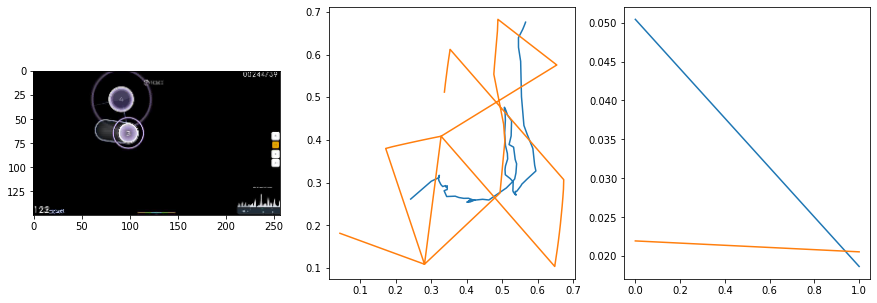

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:31<00:00:00  6.24it/s  0.0095                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 24
pred: 0.33932557702064514 0.3405325710773468
gt: 0.43057042360305786 0.5064166188240051
(114, 76)


<Figure size 1080x360 with 0 Axes>

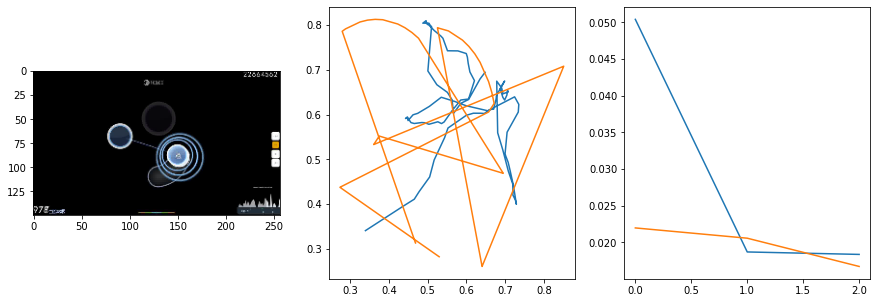

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.37it/s  0.0096                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 24
pred: 0.325175017118454 0.366285115480423
gt: 0.5890041589736938 0.49190446734428406
(139, 75)


<Figure size 1080x360 with 0 Axes>

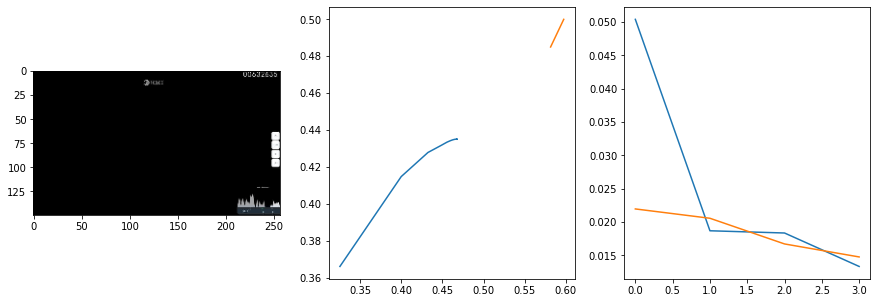

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.38it/s  0.0107                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 24
pred: 0.4132196307182312 0.25939223170280457
gt: 0.5794883370399475 0.42564818263053894
(137, 67)


<Figure size 1080x360 with 0 Axes>

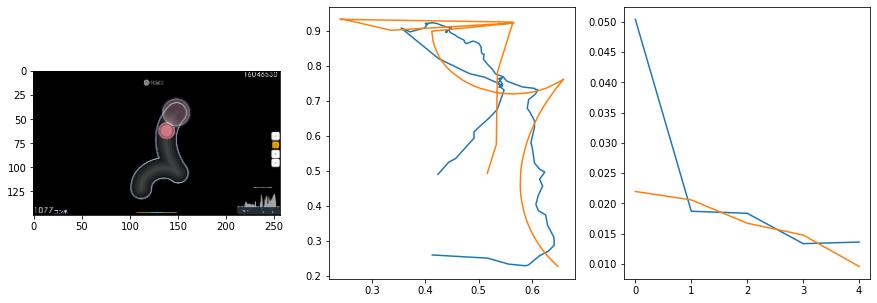

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.38it/s  0.0075                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 24
pred: 0.42641645669937134 0.5540149807929993
gt: 0.691474974155426 0.832099974155426
(155, 114)


<Figure size 1080x360 with 0 Axes>

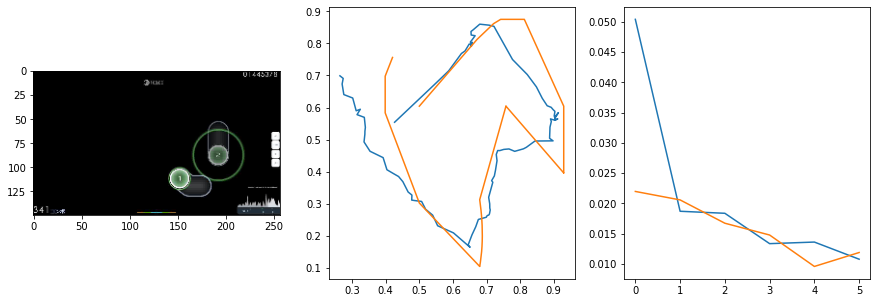

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.38it/s  0.0132                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 24
pred: 0.3373410403728485 0.38699138164520264
gt: 0.5136117935180664 0.21101759374141693
(127, 42)


<Figure size 1080x360 with 0 Axes>

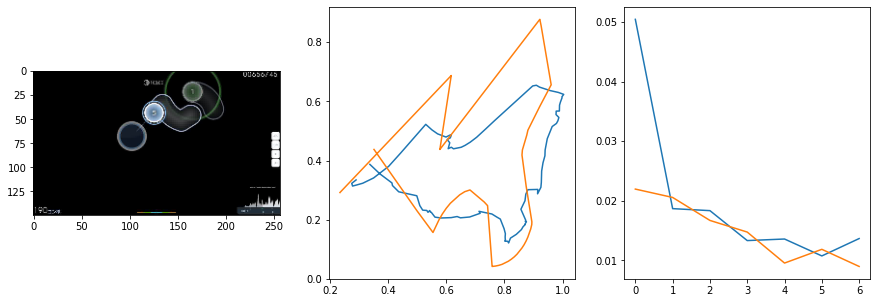

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.38it/s  0.0206                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 24
pred: 0.5205564498901367 0.6598300933837891
gt: 0.5210708379745483 0.9590452313423157
(128, 129)


<Figure size 1080x360 with 0 Axes>

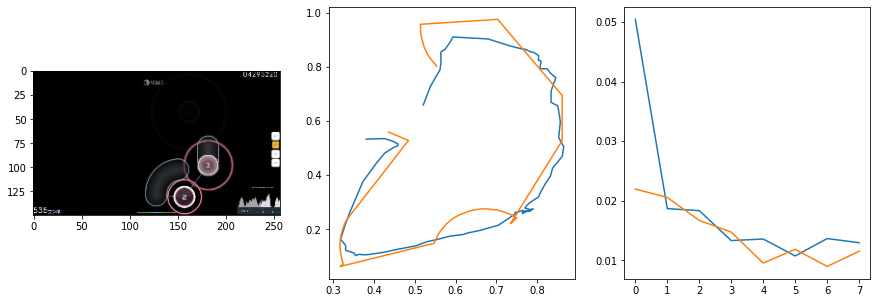

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.34it/s  0.0098                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 24
pred: 0.3784794509410858 0.643997073173523
gt: 0.7421875 0.7916666865348816
(163, 110)


<Figure size 1080x360 with 0 Axes>

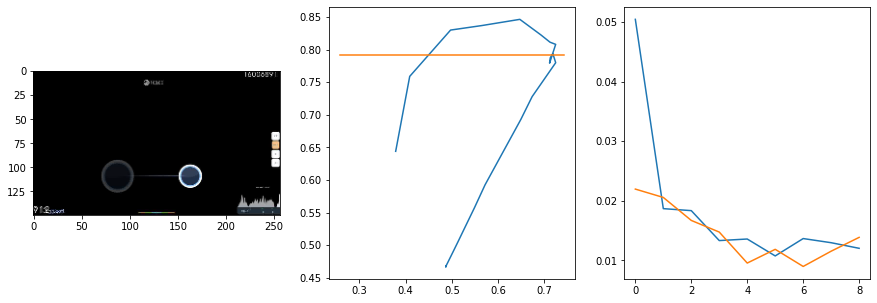

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:31<00:00:00  6.29it/s  0.0066                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 24
pred: 0.2847079932689667 0.6005369424819946
gt: 0.12085112929344177 0.5970065593719482
(66, 87)


<Figure size 1080x360 with 0 Axes>

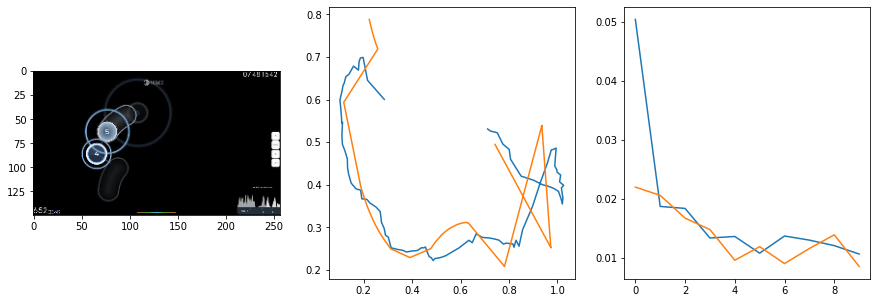

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.36it/s  0.0065                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 24
pred: 0.3576272130012512 0.6471000909805298
gt: 0.38003942370414734 0.8244418501853943
(106, 113)


<Figure size 1080x360 with 0 Axes>

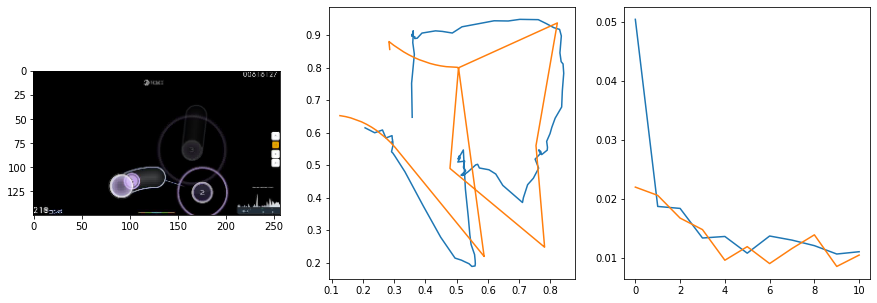

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.38it/s  0.0083                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 24
pred: 0.293876051902771 0.44705554842948914
gt: 0.05423273518681526 0.33101654052734375
(56, 56)


<Figure size 1080x360 with 0 Axes>

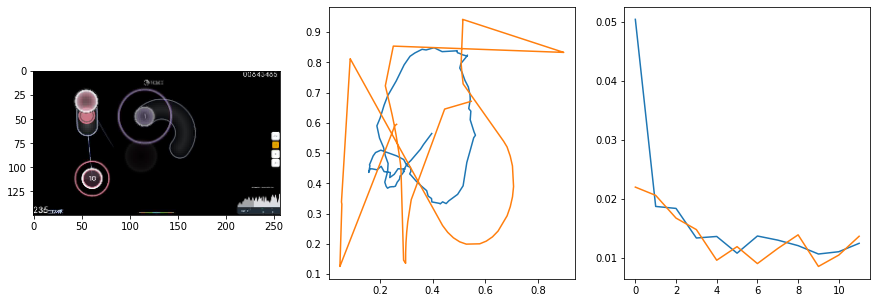

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.37it/s  0.0044                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 24
pred: 0.3937649428844452 0.6740665435791016
gt: 0.34375 0.7604166865348816
(101, 106)


<Figure size 1080x360 with 0 Axes>

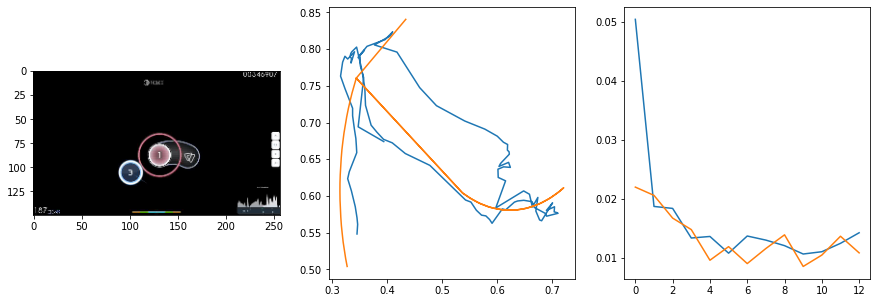

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.36it/s  0.0062                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 24
pred: 0.6565618515014648 0.47598540782928467
gt: 0.9214758276939392 0.5665591955184937
(190, 83)


<Figure size 1080x360 with 0 Axes>

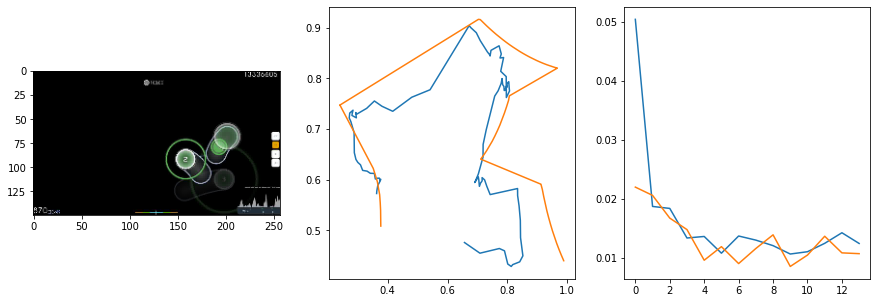

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.36it/s  0.0183                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 24
pred: 0.4882228374481201 0.3571511507034302
gt: 0.4048541486263275 0.11208236962556839
(110, 31)


<Figure size 1080x360 with 0 Axes>

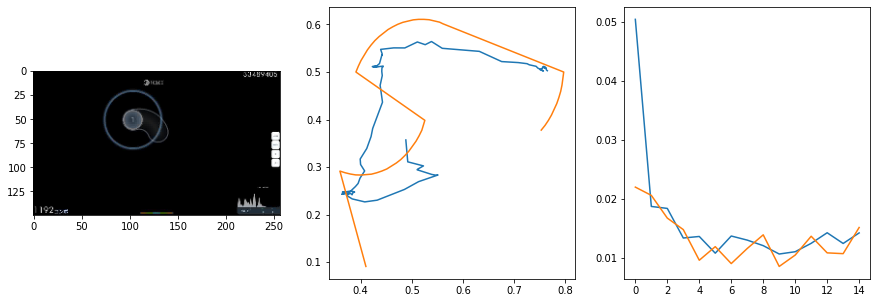

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.38it/s  0.0067                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 24
pred: 0.3313666582107544 0.5859566926956177
gt: 0.106745645403862 0.5570710301399231
(64, 82)


<Figure size 1080x360 with 0 Axes>

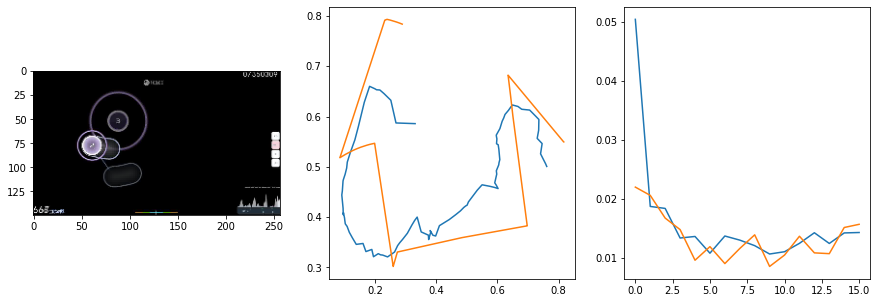

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.36it/s  0.0112                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 24
pred: 0.31568387150764465 0.26764506101608276
gt: 0.1640625 0.1875
(73, 39)


<Figure size 1080x360 with 0 Axes>

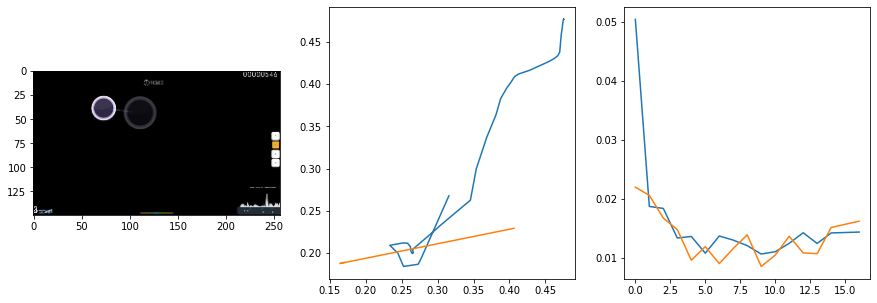

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.37it/s  0.0044                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 24
pred: 0.6391097903251648 0.4804733395576477
gt: 0.5468749403953552 0.416666716337204
(132, 66)


<Figure size 1080x360 with 0 Axes>

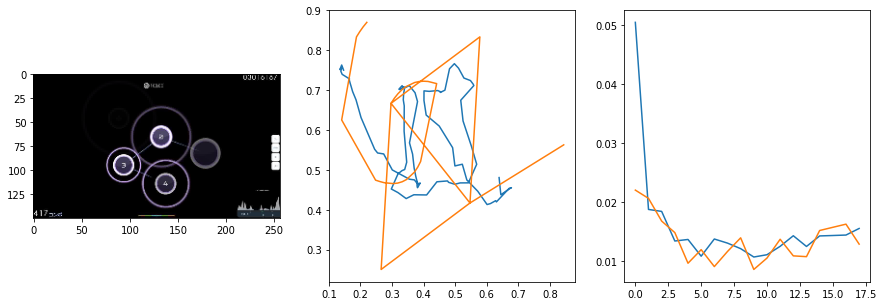

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.36it/s  0.0066                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 24
pred: 0.13214951753616333 0.22519180178642273
gt: 0.08594004064798355 0.8124960064888
(61, 112)


<Figure size 1080x360 with 0 Axes>

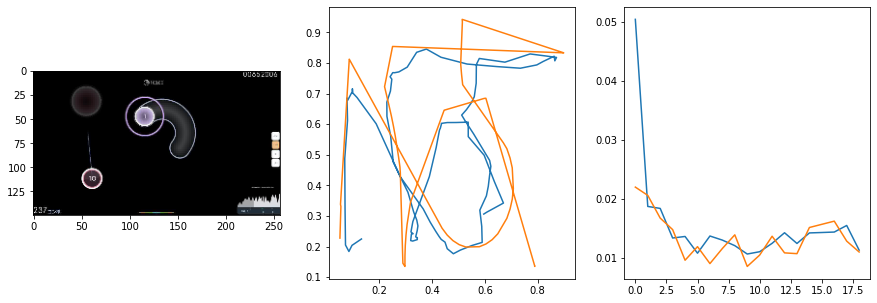

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.36it/s  0.0063                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 24
pred: 0.417011559009552 0.6338815689086914
gt: 0.47170957922935486 0.6059334874153137
(121, 88)


<Figure size 1080x360 with 0 Axes>

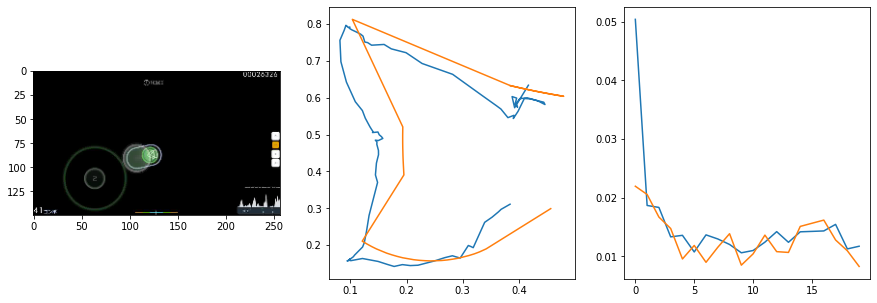

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.37it/s  0.0056                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 24
pred: 0.38094982504844666 0.5388200283050537
gt: 0.2226518839597702 0.48437896370887756
(82, 74)


<Figure size 1080x360 with 0 Axes>

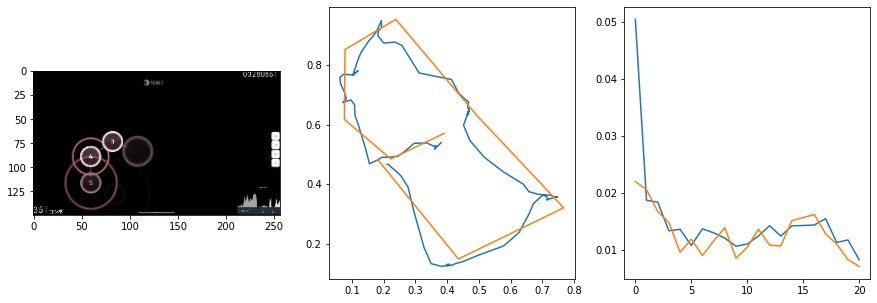

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:31<00:00:00  6.28it/s  0.0046                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 24
pred: 0.7618570327758789 0.3484489321708679
gt: 0.7138457298278809 0.1587836891412735
(158, 36)


<Figure size 1080x360 with 0 Axes>

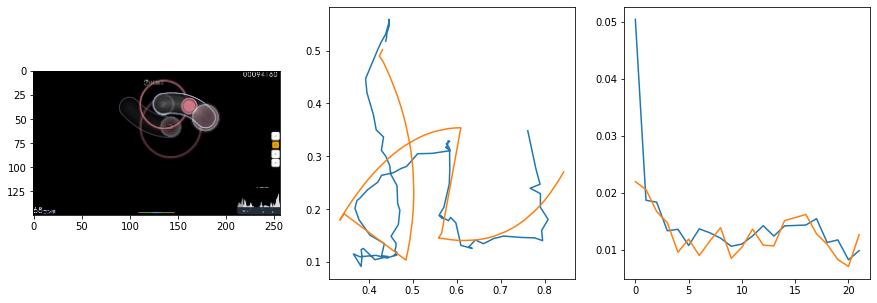

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.37it/s  0.0113                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 24
pred: 0.3412330150604248 0.32469993829727173
gt: 0.16015703976154327 0.07032347470521927
(72, 26)


<Figure size 1080x360 with 0 Axes>

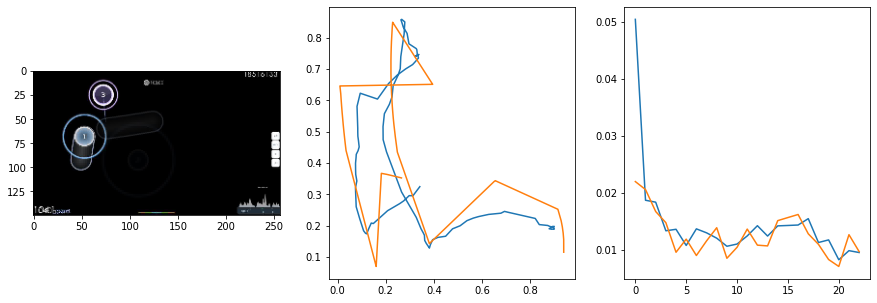

  Iters     Elapsed Time      Speed     loss                                    
 196/196  00:00:30<00:00:00  6.33it/s  0.0078                                   

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 24
pred: 0.4789958596229553 0.7824032306671143
gt: 0.39842650294303894 0.9583306312561035
(109, 129)


<Figure size 1080x360 with 0 Axes>

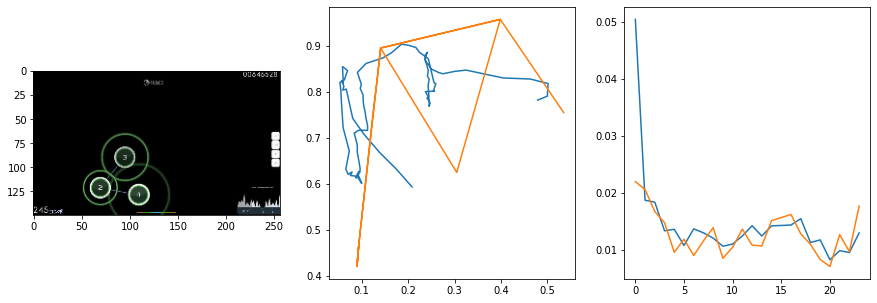

932.1585092544556 secs


In [20]:
start = time.time()

epochs = 24
trainVN()

end = time.time()
print(end - start, 'secs')

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.95it/s  0.0096                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 88
pred: 0.3398088216781616 0.40492916107177734
gt: 0.5 0.592802107334137
(125, 86)


<Figure size 1080x360 with 0 Axes>

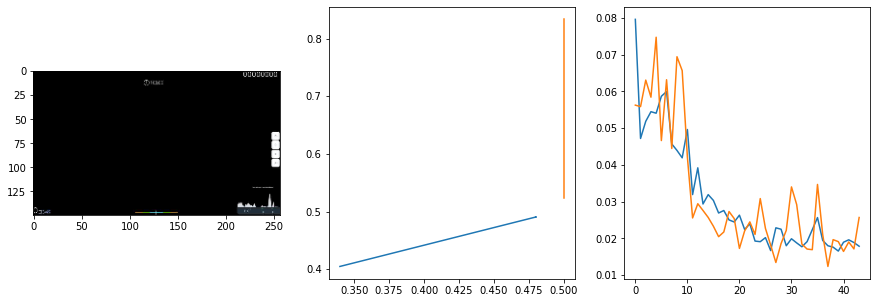

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0263                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 88
pred: 0.4272201359272003 0.36348387598991394
gt: 0.9081241488456726 0.10184690356254578
(188, 29)


<Figure size 1080x360 with 0 Axes>

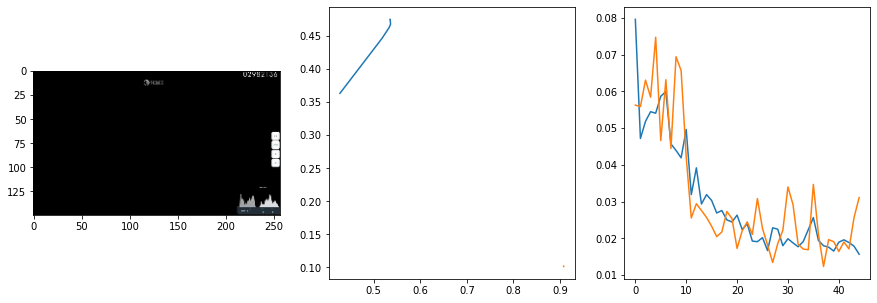

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.89it/s  0.0195                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 88
pred: 0.7495851516723633 0.5191392302513123
gt: 0.9092181324958801 0.6380316615104675
(188, 92)


<Figure size 1080x360 with 0 Axes>

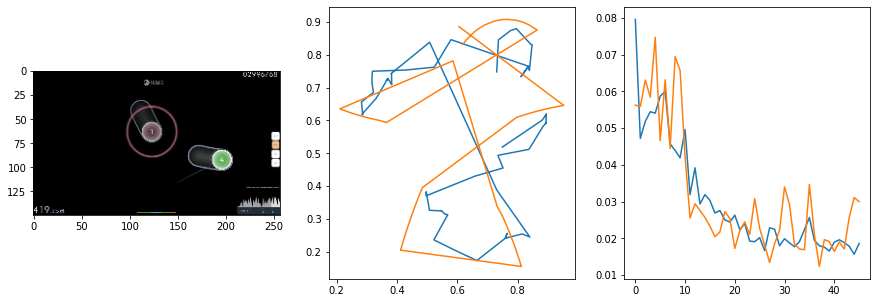

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0304                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 88
pred: 0.2719370126724243 0.43458908796310425
gt: 0.3759153187274933 0.4055052101612091
(106, 65)


<Figure size 1080x360 with 0 Axes>

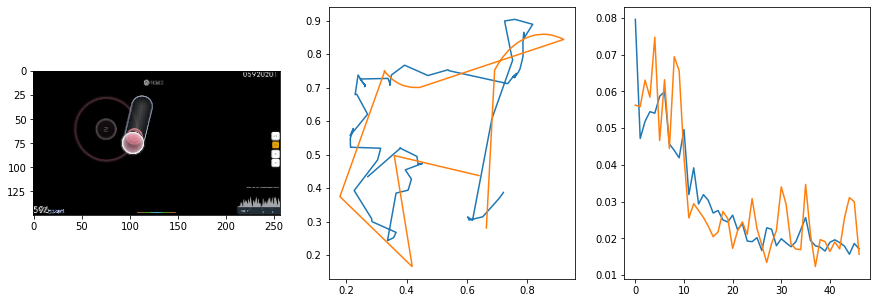

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.62it/s  0.0101                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 88
pred: 0.1429217904806137 0.182284876704216
gt: 0.2581036686897278 0.1590116024017334
(88, 36)


<Figure size 1080x360 with 0 Axes>

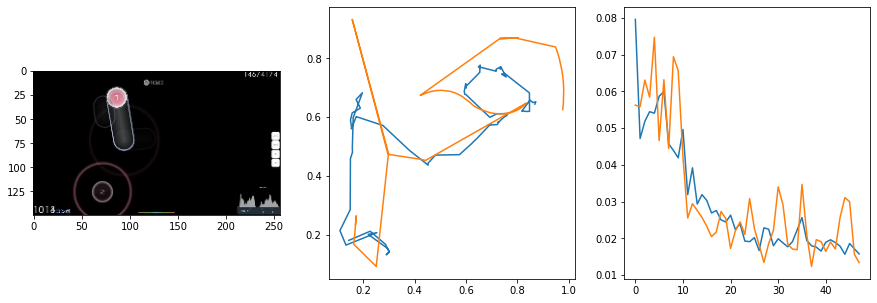

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0233                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 88
pred: 0.25431352853775024 0.45191335678100586
gt: 0.4062502086162567 0.6770834922790527
(111, 96)


<Figure size 1080x360 with 0 Axes>

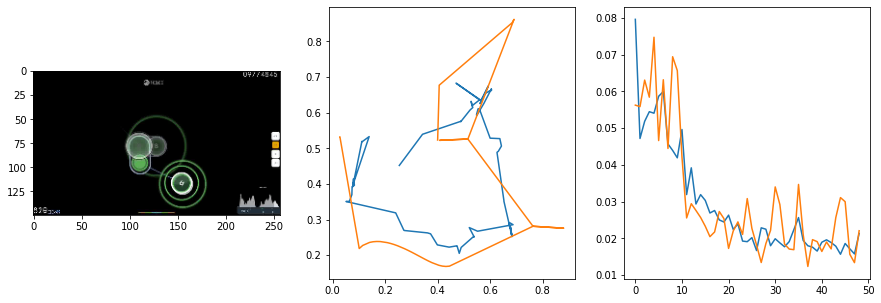

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.77it/s  0.0172                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 88
pred: 0.5957349538803101 0.18608039617538452
gt: 0.8174630999565125 0.22101706266403198
(174, 43)


<Figure size 1080x360 with 0 Axes>

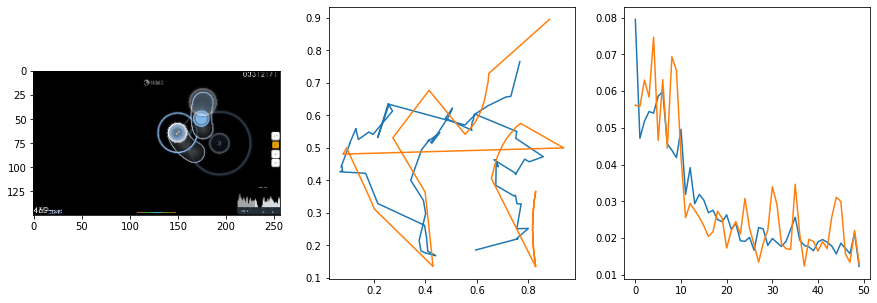

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0118                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 88
pred: 0.09011228382587433 0.5418283343315125
gt: 0.4997604787349701 0.38599511981010437
(125, 62)


<Figure size 1080x360 with 0 Axes>

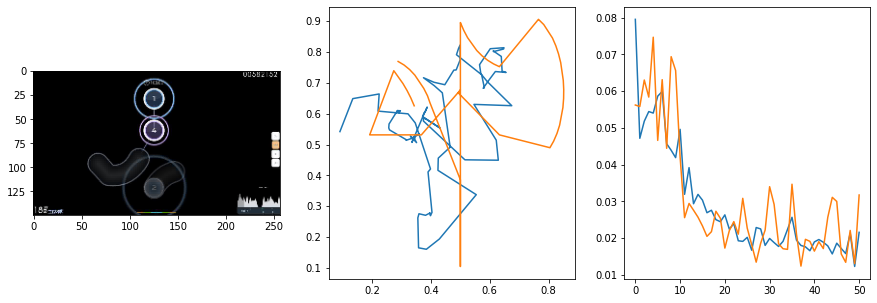

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0126                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 88
pred: 0.36842527985572815 0.4598790109157562
gt: 0.43762415647506714 0.4008204936981201
(115, 64)


<Figure size 1080x360 with 0 Axes>

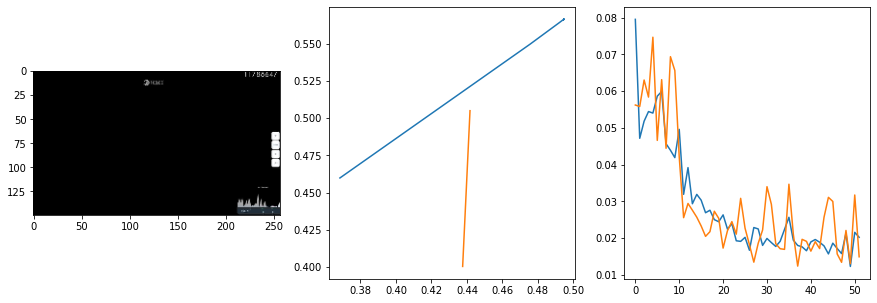

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.04it/s  0.0338                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 88
pred: 0.17251741886138916 0.22657454013824463
gt: 0.203125 0.2916666567325592
(79, 51)


<Figure size 1080x360 with 0 Axes>

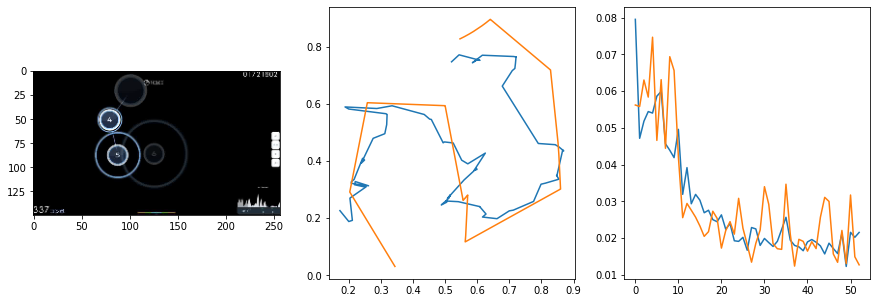

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.88it/s  0.0165                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 88
pred: 0.3279265761375427 0.3822954297065735
gt: 0.4459933936595917 0.27307912707328796
(117, 49)


<Figure size 1080x360 with 0 Axes>

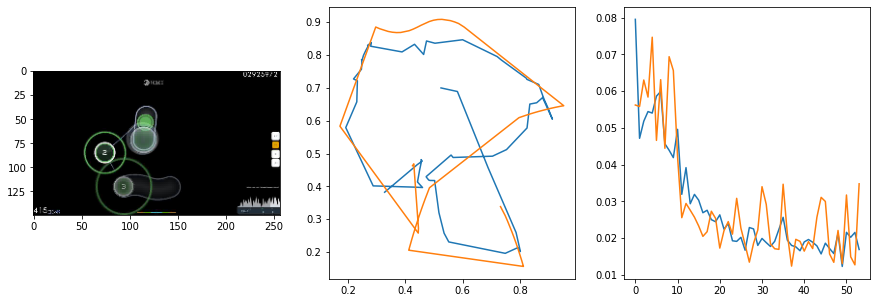

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.80it/s  0.0180                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 88
pred: 0.6347373127937317 0.5207143425941467
gt: 0.765625 0.6041666865348816
(166, 88)


<Figure size 1080x360 with 0 Axes>

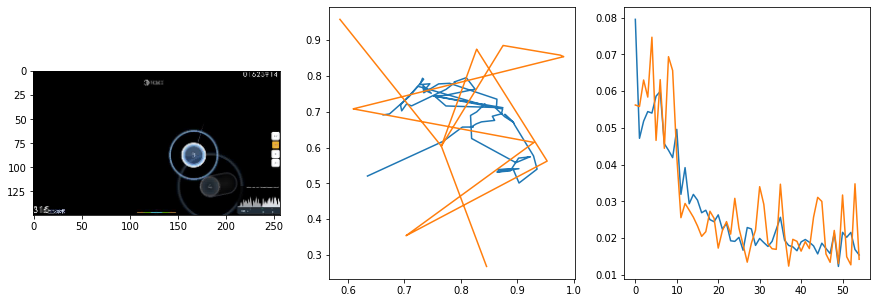

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.85it/s  0.0083                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 88
pred: 0.3150838017463684 0.19204959273338318
gt: 0.2083991914987564 0.23533093929290771
(80, 45)


<Figure size 1080x360 with 0 Axes>

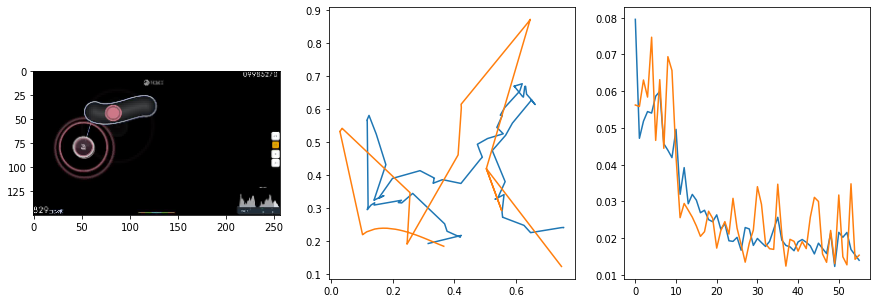

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0579                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 88
pred: 0.3807389736175537 0.5952995419502258
gt: 0.6951016187667847 0.35482272505760193
(155, 59)


<Figure size 1080x360 with 0 Axes>

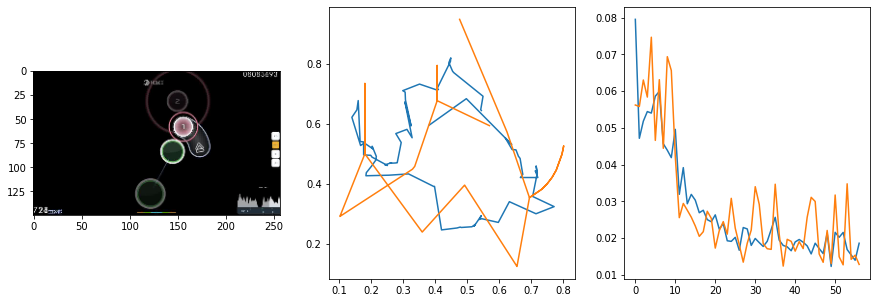

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.69it/s  0.0123                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 88
pred: 0.1141323447227478 0.691931426525116
gt: 0.12557563185691833 0.6530864834785461
(67, 93)


<Figure size 1080x360 with 0 Axes>

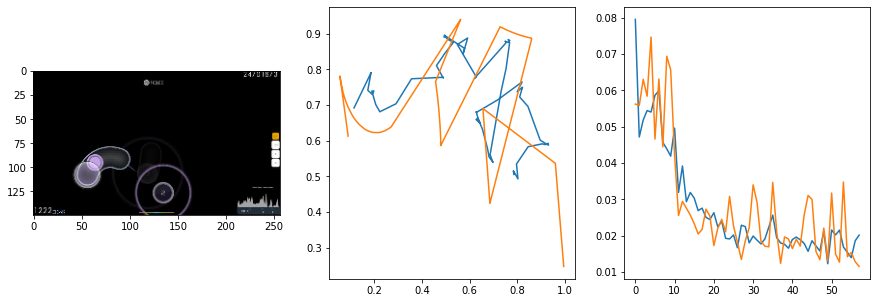

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.95it/s  0.0307                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 88
pred: 0.07469813525676727 0.43651172518730164
gt: 0.0625 0.39583340287208557
(57, 64)


<Figure size 1080x360 with 0 Axes>

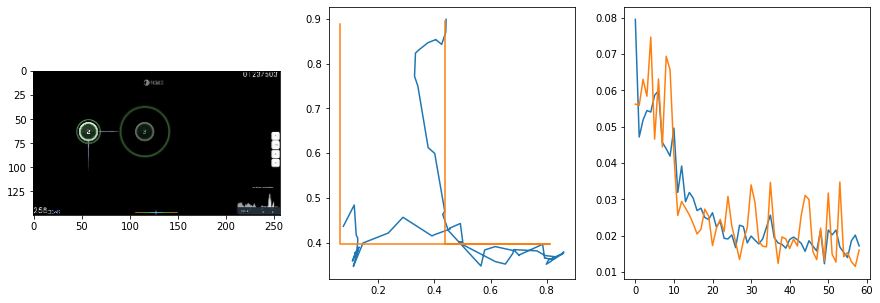

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.01it/s  0.0130                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 88
pred: 0.2038351446390152 0.41433101892471313
gt: 0.236328125 0.2916666567325592
(84, 51)


<Figure size 1080x360 with 0 Axes>

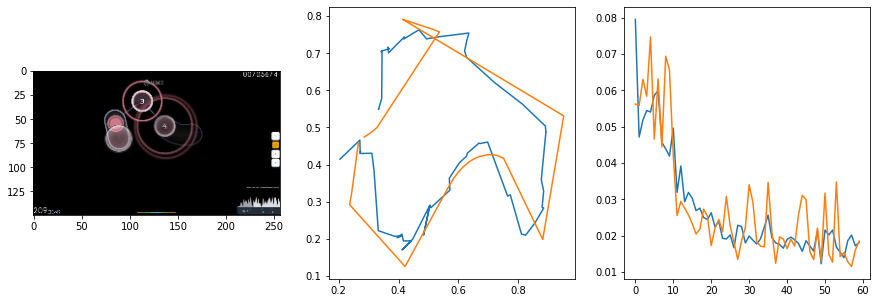

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0124                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 88
pred: 0.5178343057632446 0.17416736483573914
gt: 0.5703134536743164 0.28124818205833435
(136, 50)


<Figure size 1080x360 with 0 Axes>

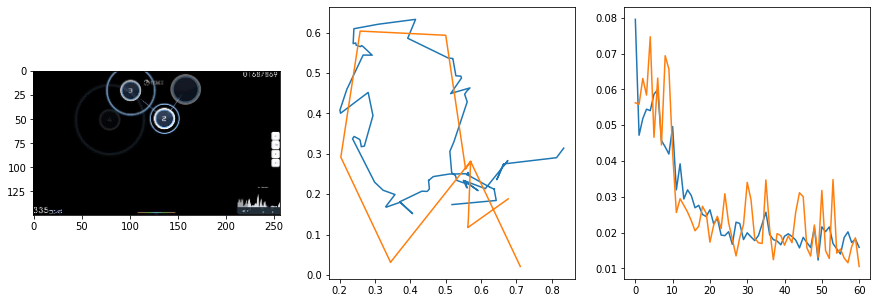

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.00it/s  0.0076                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 88
pred: 0.0948370099067688 0.5702152848243713
gt: 0.11356445401906967 0.4646911323070526
(65, 72)


<Figure size 1080x360 with 0 Axes>

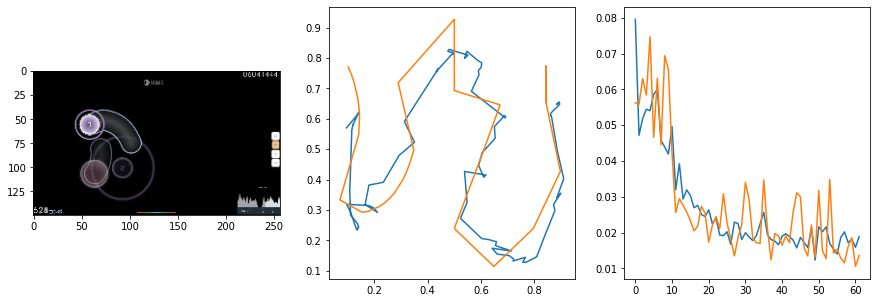

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.96it/s  0.0078                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 88
pred: 0.33329737186431885 0.6936861872673035
gt: 0.37085863947868347 0.8866925835609436
(105, 121)


<Figure size 1080x360 with 0 Axes>

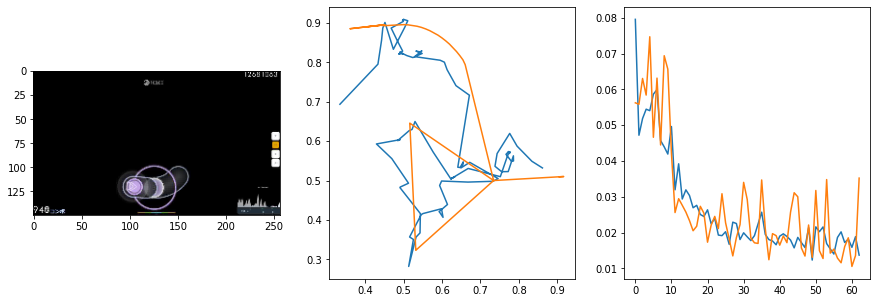

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.94it/s  0.0304                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 88
pred: 0.3198462724685669 0.4094091057777405
gt: 0.5 0.4479166567325592
(125, 70)


<Figure size 1080x360 with 0 Axes>

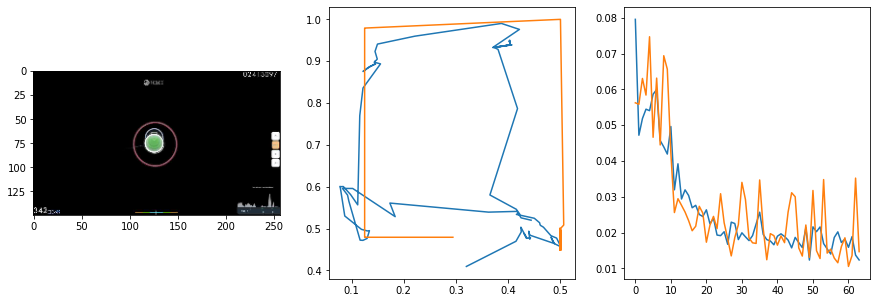

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0689                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 88
pred: 0.24279417097568512 0.6949377655982971
gt: 0.2252112478017807 0.8842318058013916
(82, 120)


<Figure size 1080x360 with 0 Axes>

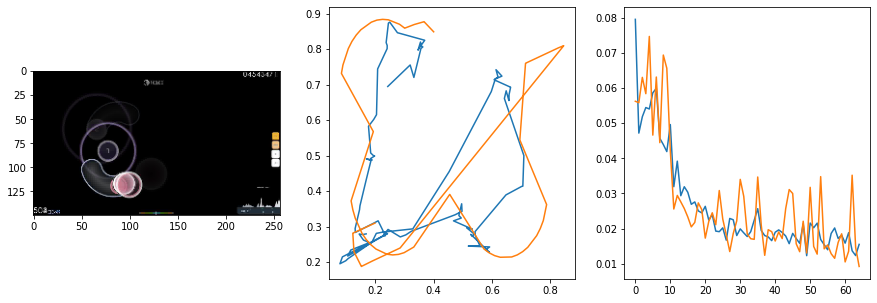

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0132                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 88
pred: 0.3596871495246887 0.39075154066085815
gt: 0.568359375 0.2317708283662796
(136, 44)


<Figure size 1080x360 with 0 Axes>

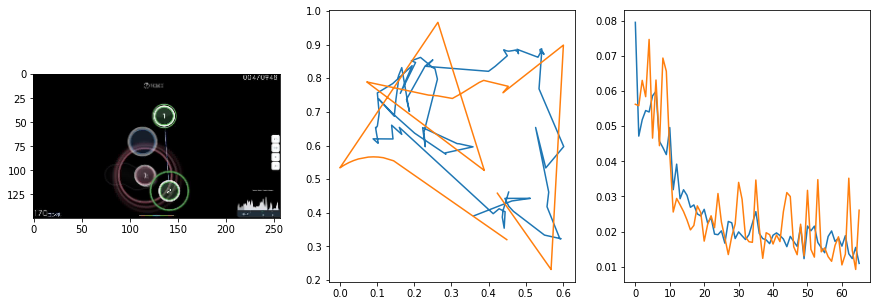

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0116                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 88
pred: 0.43429768085479736 0.3250504434108734
gt: 0.5 0.3423333168029785
(125, 57)


<Figure size 1080x360 with 0 Axes>

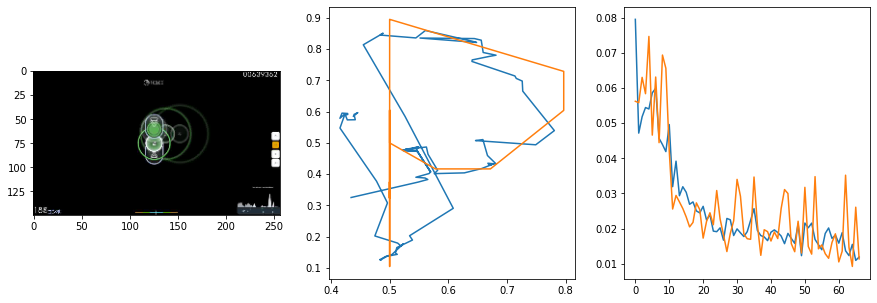

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.97it/s  0.0074                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 88
pred: 0.5591009855270386 0.7050713896751404
gt: 0.7479168176651001 0.8372669219970703
(163, 115)


<Figure size 1080x360 with 0 Axes>

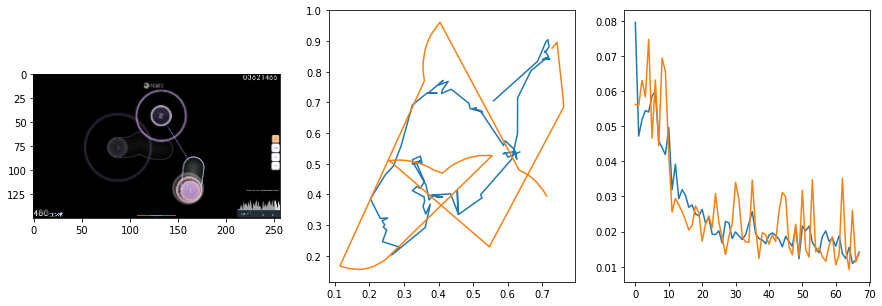

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.89it/s  0.0090                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 88
pred: 0.2542351186275482 0.2978101074695587
gt: 0.41372036933898926 0.6767285466194153
(112, 96)


<Figure size 1080x360 with 0 Axes>

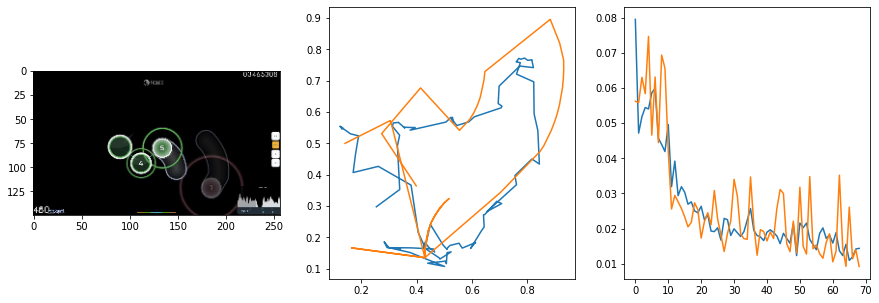

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0068                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 88
pred: 0.11930951476097107 0.30564627051353455
gt: 0.25390625 0.1848958283662796
(87, 39)


<Figure size 1080x360 with 0 Axes>

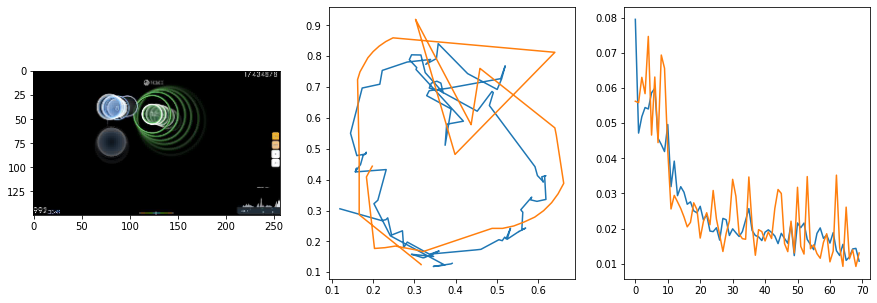

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0240                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 88
pred: 0.2120939940214157 0.2626517415046692
gt: 0.34687504172325134 0.35833337903022766
(101, 59)


<Figure size 1080x360 with 0 Axes>

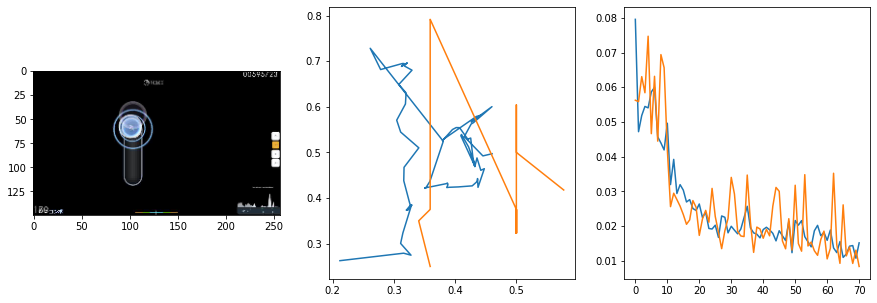

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0045                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 88
pred: 0.36516422033309937 0.41768306493759155
gt: 0.6381779313087463 0.2040347307920456
(146, 41)


<Figure size 1080x360 with 0 Axes>

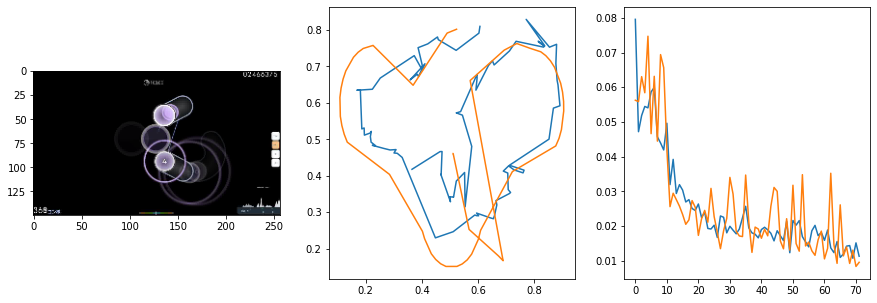

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.89it/s  0.0077                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 88
pred: 0.06851674616336823 0.3624265789985657
gt: 0.06250003725290298 0.3958333432674408
(57, 64)


<Figure size 1080x360 with 0 Axes>

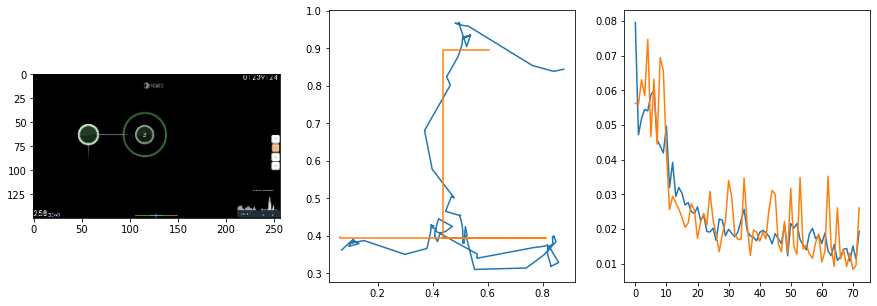

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0156                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 88
pred: 0.22721049189567566 0.5555974841117859
gt: 0.30988019704818726 0.8326518535614014
(96, 114)


<Figure size 1080x360 with 0 Axes>

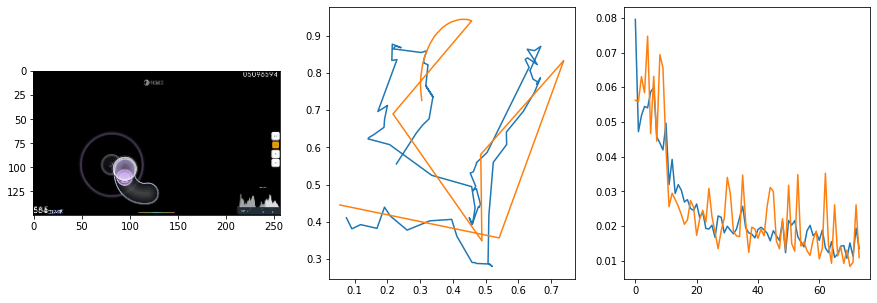

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0050                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 88
pred: 0.2158745974302292 0.2298528403043747
gt: 0.7350624799728394 0.12591667473316193
(161, 32)


<Figure size 1080x360 with 0 Axes>

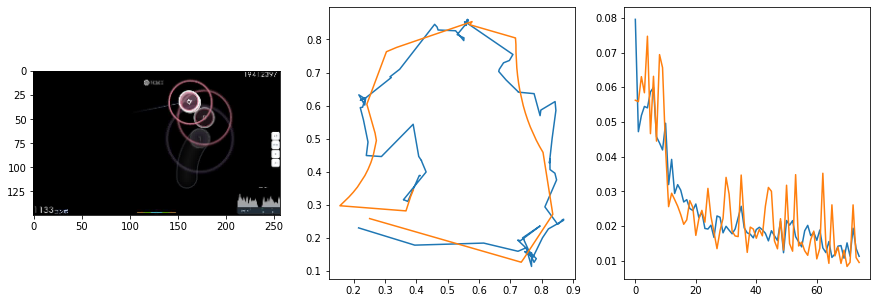

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0051                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 88
pred: 0.7020131945610046 0.43666210770606995
gt: 0.9686452150344849 0.5
(198, 76)


<Figure size 1080x360 with 0 Axes>

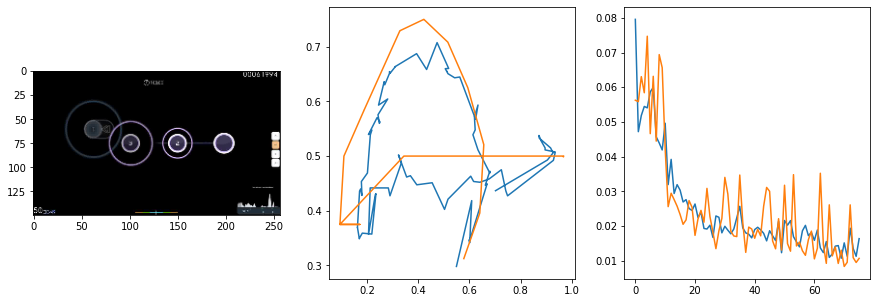

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.94it/s  0.0090                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 88
pred: 0.5624576807022095 0.19622494280338287
gt: 0.7930489778518677 0.43092748522758484
(170, 68)


<Figure size 1080x360 with 0 Axes>

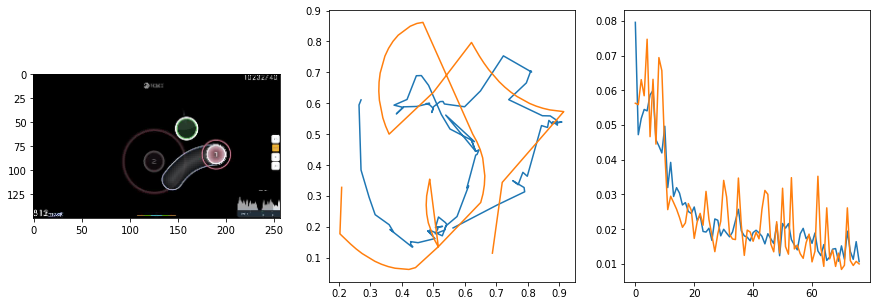

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.99it/s  0.0049                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 88
pred: 0.22691360116004944 0.523638129234314
gt: 0.45967206358909607 0.5972710847854614
(119, 87)


<Figure size 1080x360 with 0 Axes>

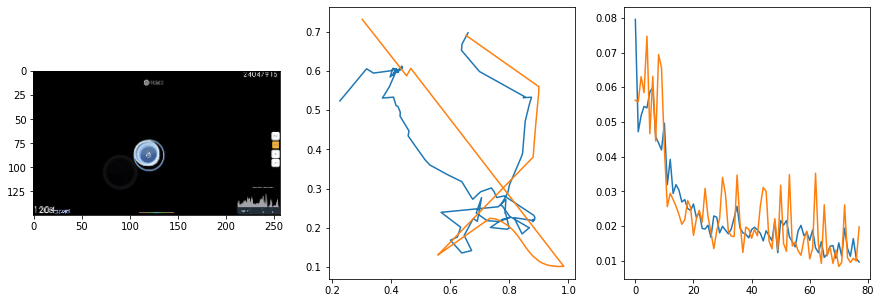

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0120                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 88
pred: 0.4144948720932007 0.4694279432296753
gt: 0.6697119474411011 0.7803146243095398
(151, 108)


<Figure size 1080x360 with 0 Axes>

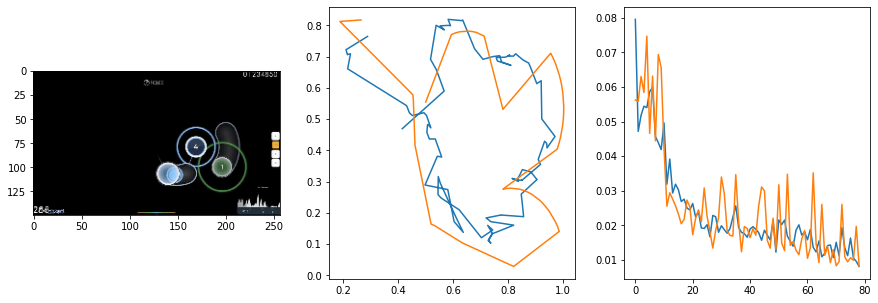

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0091                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 88
pred: 0.18375062942504883 0.22933679819107056
gt: 0.109375 0.1875
(64, 39)


<Figure size 1080x360 with 0 Axes>

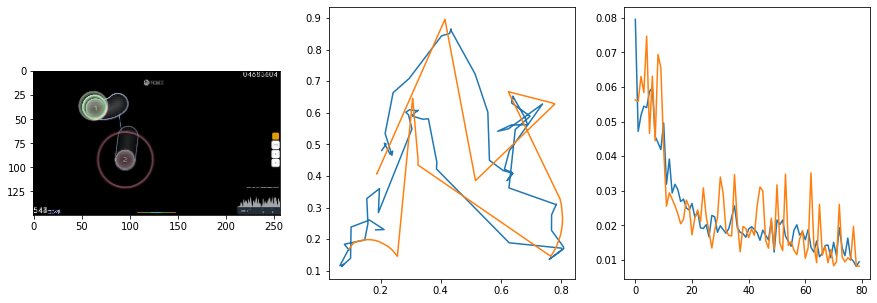

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.03it/s  0.0257                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 88
pred: 0.4628050923347473 0.48622411489486694
gt: 0.6558631062507629 0.517738401889801
(149, 78)


<Figure size 1080x360 with 0 Axes>

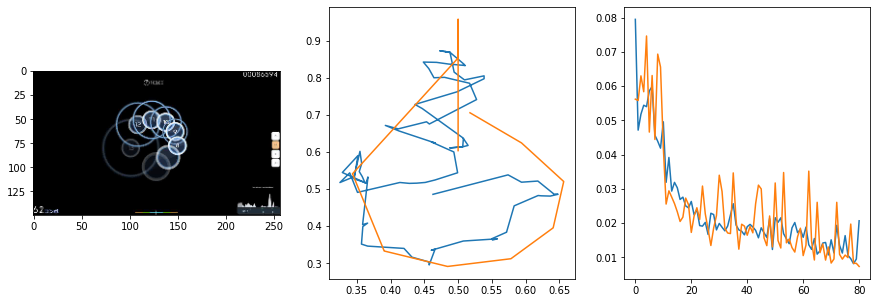

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.97it/s  0.0093                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 88
pred: 0.6794474124908447 0.6156796216964722
gt: 0.6519722938537598 0.693596363067627
(149, 98)


<Figure size 1080x360 with 0 Axes>

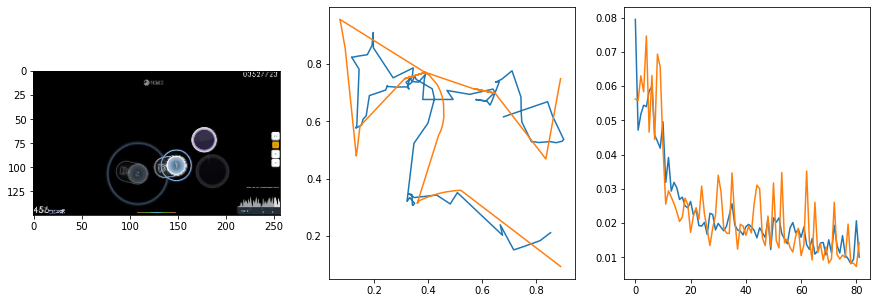

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.86it/s  0.0138                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

63 of 88
pred: 0.09463439881801605 0.5013193488121033
gt: 0.1152343824505806 0.796875
(65, 110)


<Figure size 1080x360 with 0 Axes>

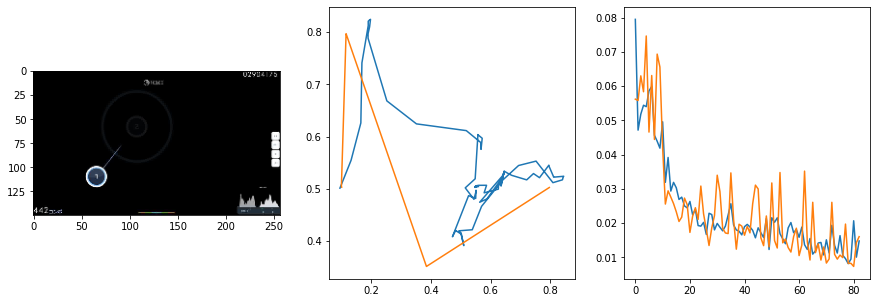

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.54it/s  0.0181                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

64 of 88
pred: 0.512139618396759 0.31099849939346313
gt: 0.7191264033317566 0.3926389515399933
(159, 63)


<Figure size 1080x360 with 0 Axes>

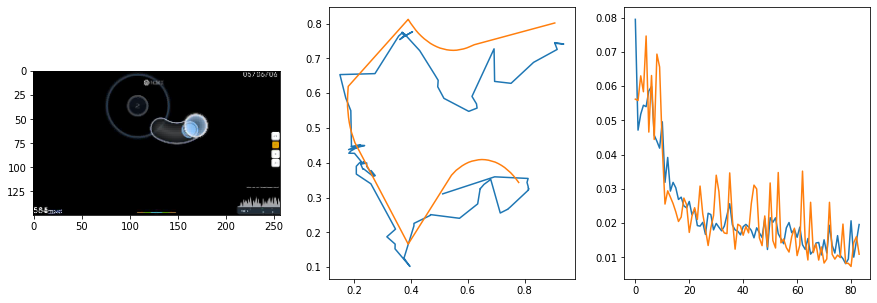

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.96it/s  0.0088                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

65 of 88
pred: 0.39550960063934326 0.08673614263534546
gt: 0.37237322330474854 0.5863038301467896
(105, 86)


<Figure size 1080x360 with 0 Axes>

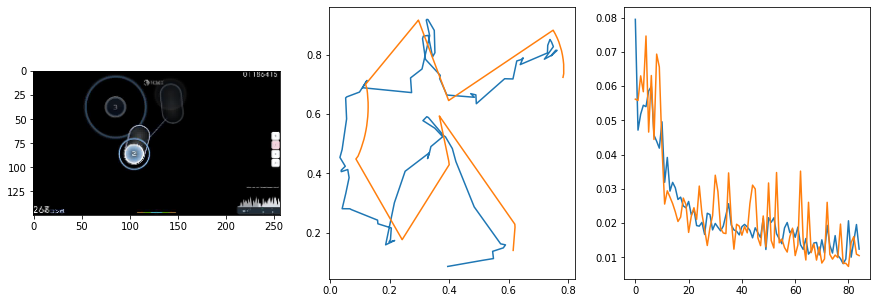

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.95it/s  0.0082                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

66 of 88
pred: 0.5509893894195557 0.10306735336780548
gt: 0.7578125 0.15625
(165, 36)


<Figure size 1080x360 with 0 Axes>

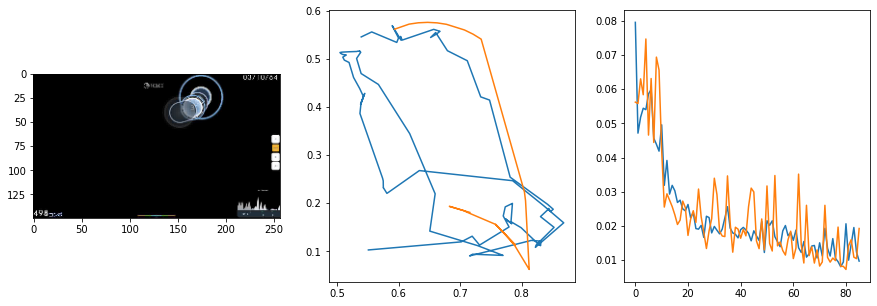

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.76it/s  0.0037                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

67 of 88
pred: 0.21366742253303528 0.38623282313346863
gt: 0.224609375 0.796875
(82, 110)


<Figure size 1080x360 with 0 Axes>

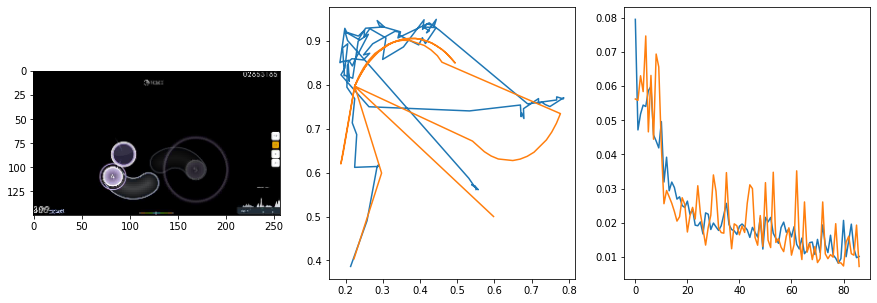

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.86it/s  0.0070                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

68 of 88
pred: 0.37410640716552734 0.0899704098701477
gt: 0.07812794297933578 0.4895804226398468
(60, 74)


<Figure size 1080x360 with 0 Axes>

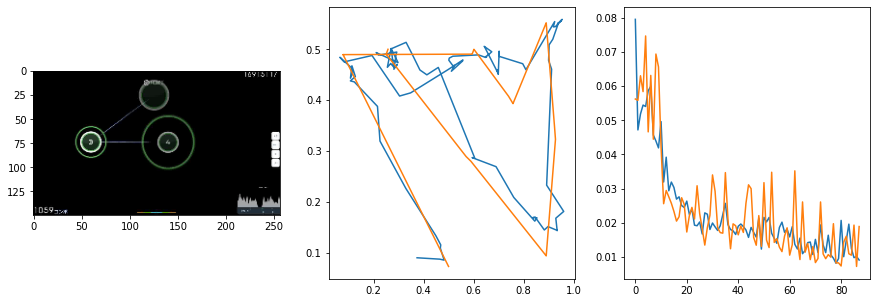

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.95it/s  0.0069                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

69 of 88
pred: 0.26130807399749756 0.09324189275503159
gt: 0.3298821449279785 0.39276644587516785
(99, 63)


<Figure size 1080x360 with 0 Axes>

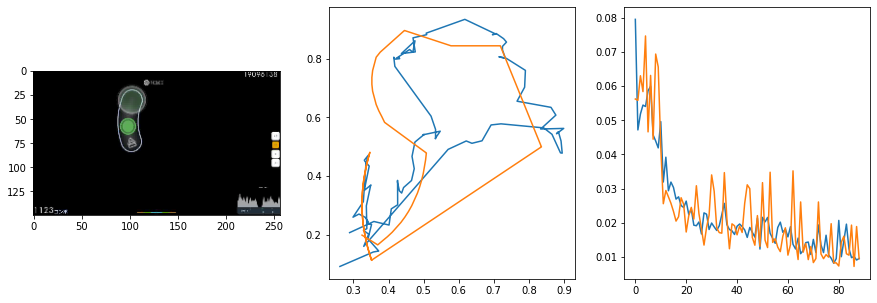

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0075                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

70 of 88
pred: 0.5239004492759705 0.4433456063270569
gt: 0.848694384098053 0.4334050714969635
(179, 68)


<Figure size 1080x360 with 0 Axes>

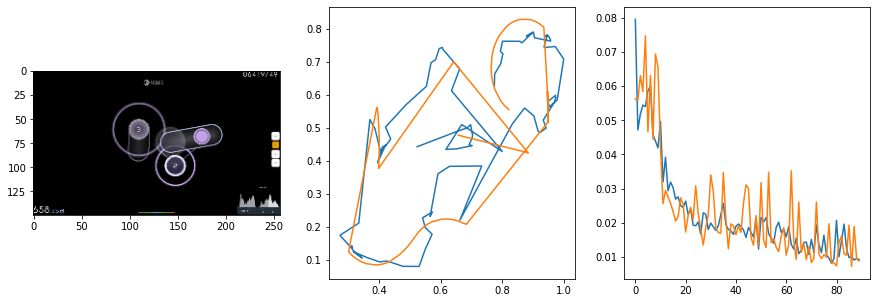

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0064                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

71 of 88
pred: 0.0695226788520813 0.38816171884536743
gt: 0.1425783932209015 0.46875008940696716
(70, 72)


<Figure size 1080x360 with 0 Axes>

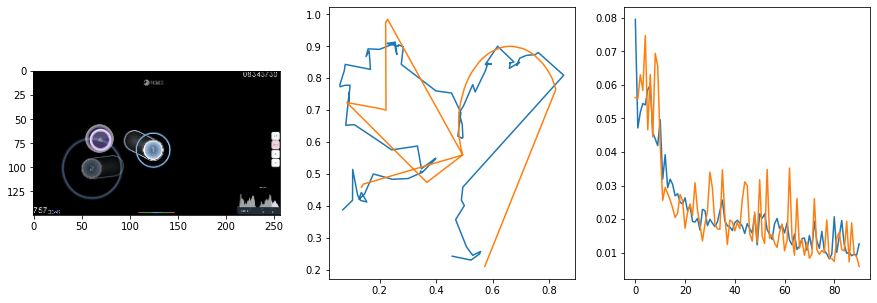

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0104                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

72 of 88
pred: 0.25252819061279297 0.6250584721565247
gt: 0.6171875 0.40625
(143, 65)


<Figure size 1080x360 with 0 Axes>

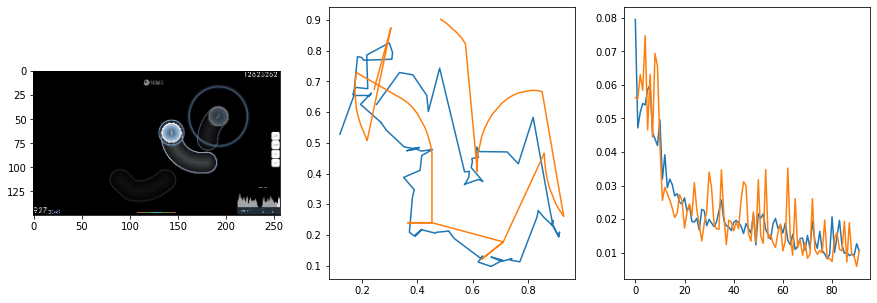

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0036                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

73 of 88
pred: 0.5790014266967773 0.6274741888046265
gt: 0.5802170038223267 0.34389904141426086
(137, 57)


<Figure size 1080x360 with 0 Axes>

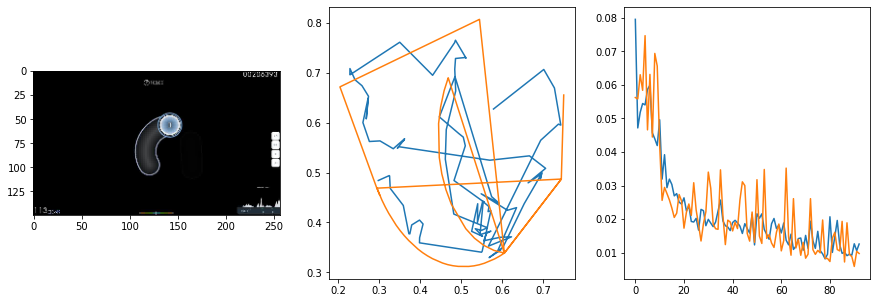

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0053                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

74 of 88
pred: 0.27077406644821167 0.16598589718341827
gt: 0.40625 0.15625
(111, 36)


<Figure size 1080x360 with 0 Axes>

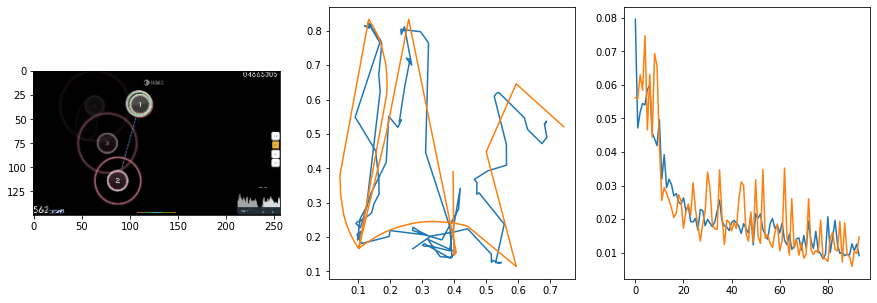

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.84it/s  0.0059                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

75 of 88
pred: 0.3716086745262146 0.4101245403289795
gt: 0.4722953140735626 0.5245475172996521
(121, 79)


<Figure size 1080x360 with 0 Axes>

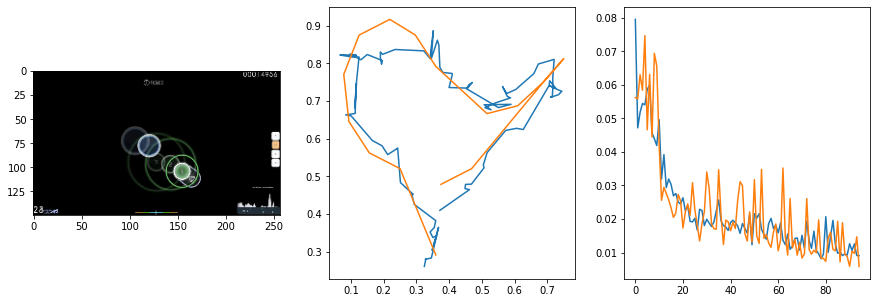

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0198                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

76 of 88
pred: 0.5947864651679993 0.4932645857334137
gt: 0.6806761622428894 0.6783477663993835
(153, 96)


<Figure size 1080x360 with 0 Axes>

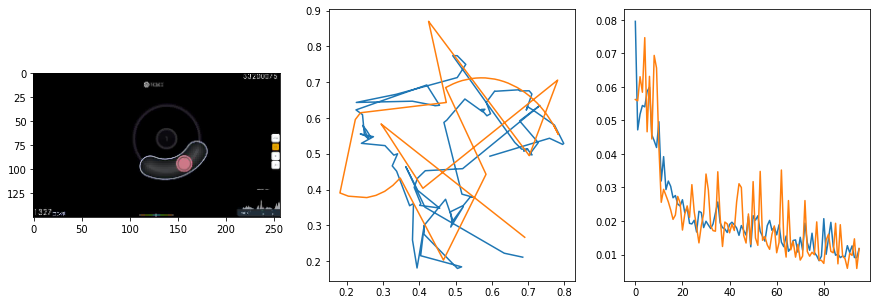

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.88it/s  0.0752                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

77 of 88
pred: 0.3967525362968445 0.4146682918071747
gt: 0.5 0.8333333134651184
(125, 114)


<Figure size 1080x360 with 0 Axes>

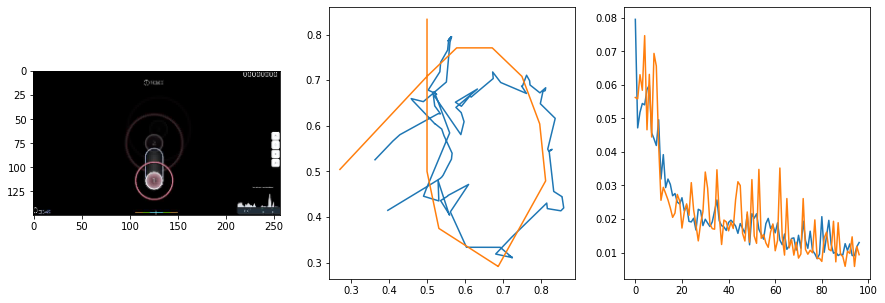

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.79it/s  0.0072                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

78 of 88
pred: 0.39101409912109375 0.4153638482093811
gt: 0.2890640199184418 0.8749993443489075
(92, 119)


<Figure size 1080x360 with 0 Axes>

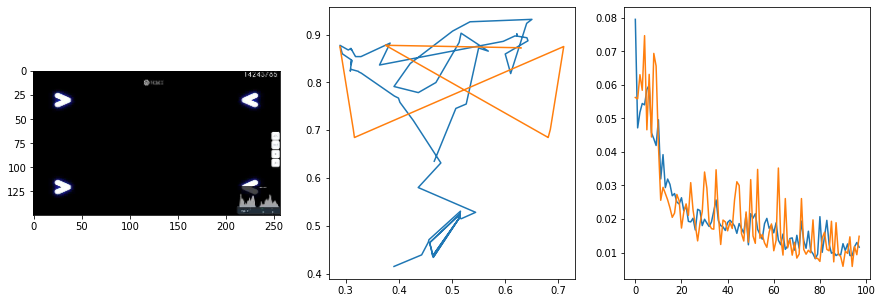

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.75it/s  0.0075                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

79 of 88
pred: 0.42576414346694946 0.14149299263954163
gt: 0.7226439714431763 3.321805706946179e-05
(160, 18)


<Figure size 1080x360 with 0 Axes>

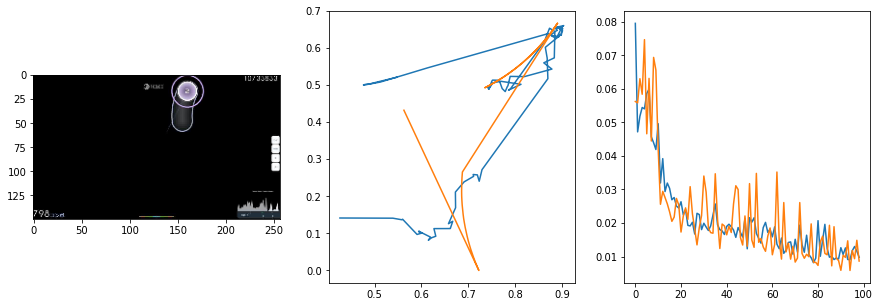

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0065                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

80 of 88
pred: 0.4944317936897278 0.6418885588645935
gt: 0.796875 0.7239583134651184
(171, 102)


<Figure size 1080x360 with 0 Axes>

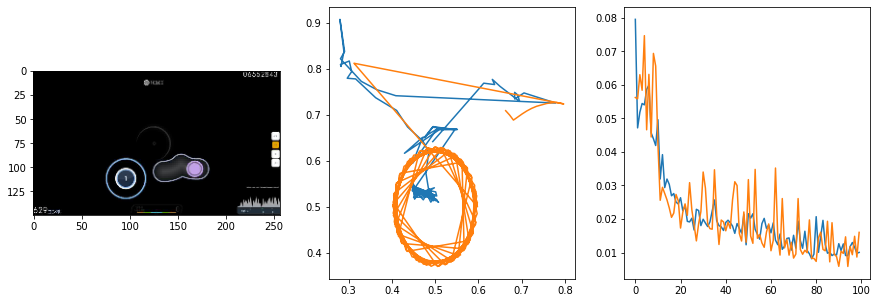

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0078                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

81 of 88
pred: 0.5543646216392517 0.3663502335548401
gt: 0.9843254685401917 0.10161083191633224
(200, 29)


<Figure size 1080x360 with 0 Axes>

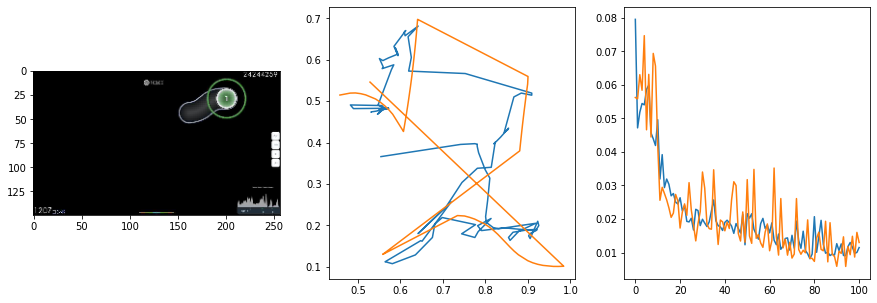

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0069                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

82 of 88
pred: 0.09117414057254791 0.4412083625793457
gt: 0.174734964966774 0.640178382396698
(75, 92)


<Figure size 1080x360 with 0 Axes>

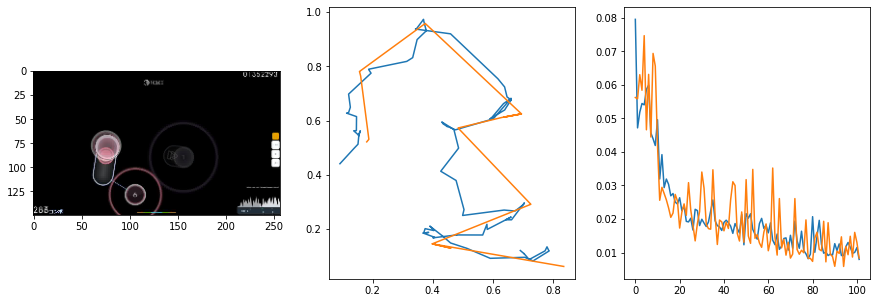

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0047                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

83 of 88
pred: 0.37339136004447937 0.42034000158309937
gt: 0.46100160479545593 0.43760260939598083
(119, 68)


<Figure size 1080x360 with 0 Axes>

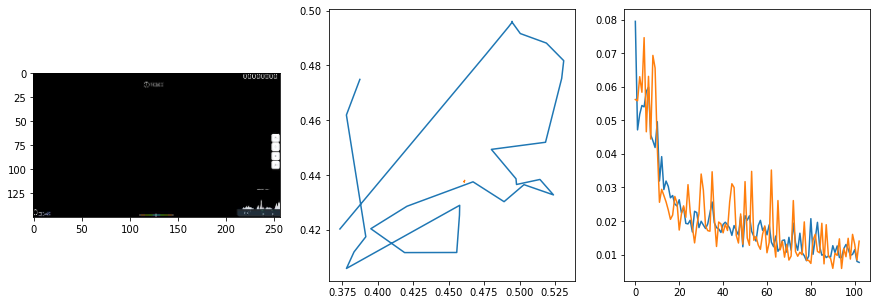

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0066                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

84 of 88
pred: 0.640884280204773 0.5555979013442993
gt: 0.6375055313110352 0.6354933381080627
(146, 91)


<Figure size 1080x360 with 0 Axes>

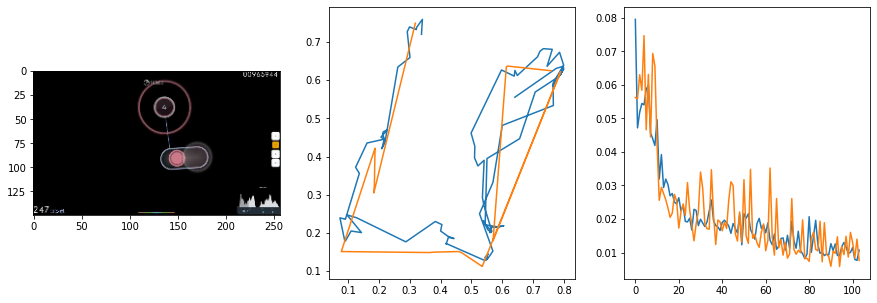

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.66it/s  0.0046                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

85 of 88
pred: 0.721570611000061 0.5145670771598816
gt: 0.6700232028961182 0.2254335731267929
(151, 44)


<Figure size 1080x360 with 0 Axes>

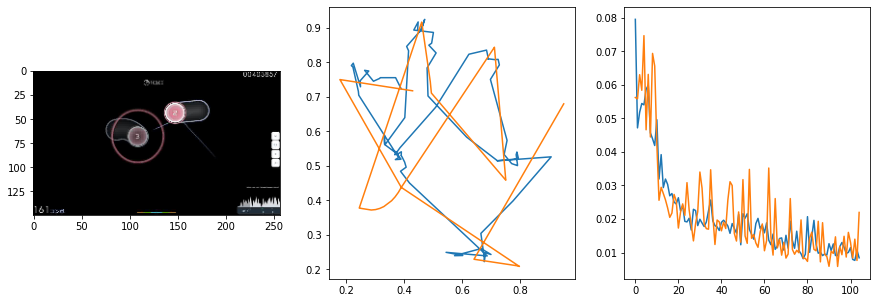

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.03it/s  0.0240                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

86 of 88
pred: 0.4039129614830017 0.6509961485862732
gt: 0.7031252384185791 0.861979067325592
(157, 118)


<Figure size 1080x360 with 0 Axes>

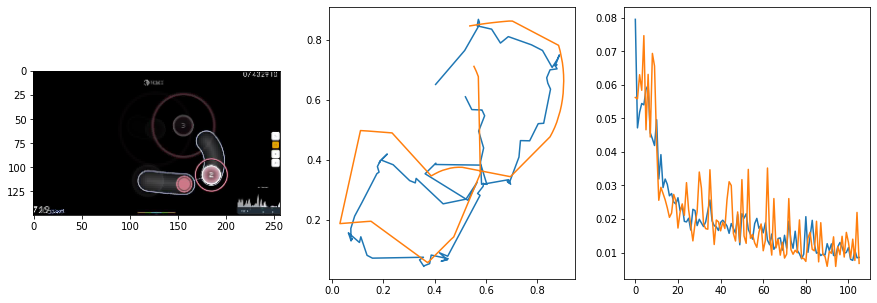

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.03it/s  0.0097                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

87 of 88
pred: 0.5404373407363892 0.6534562706947327
gt: 0.5379970669746399 0.5563644170761108
(131, 82)


<Figure size 1080x360 with 0 Axes>

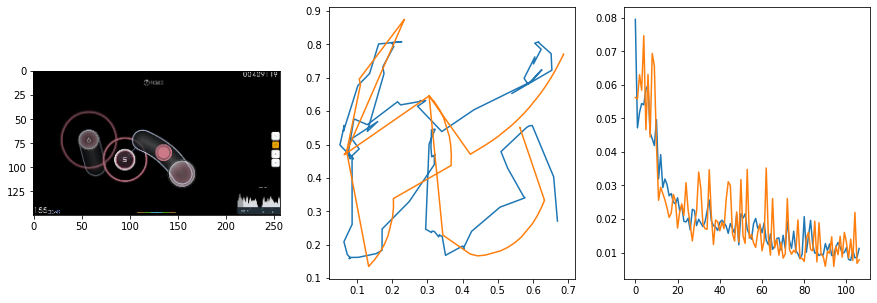

370.68928694725037 secs


In [24]:
start = time.time()

epochs = 64
trainVN()

end = time.time()
print(end - start, 'secs')

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:03<00:00:00  6.29it/s  0.0015                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

152 of 216
pred: 0.22386455535888672 0.021220676600933075
gt: 0.7555744647979736 0.033633019775152206
(165, 21)


<Figure size 1080x360 with 0 Axes>

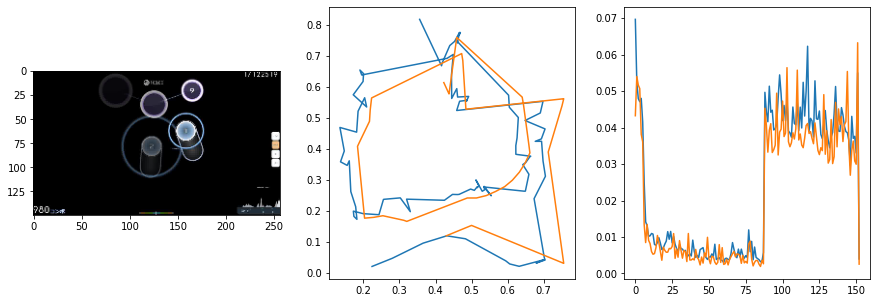

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:03<00:00:00  6.29it/s  0.0080                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

153 of 216
pred: 0.39971232414245605 0.23657524585723877
gt: 0.5 0.1784999966621399
(125, 38)


<Figure size 1080x360 with 0 Axes>

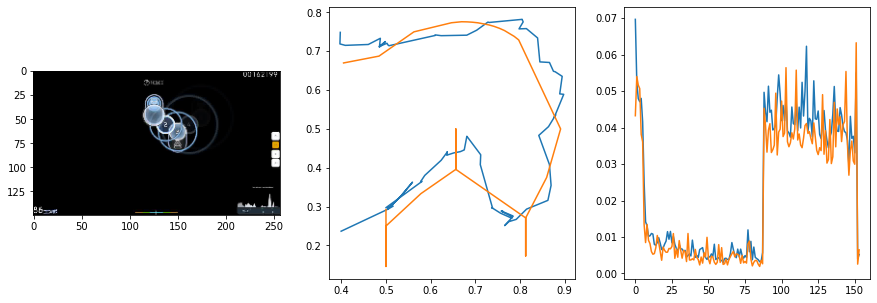

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:03<00:00:00  6.29it/s  0.0103                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

154 of 216
pred: 0.6441504955291748 0.3201500177383423
gt: 0.8803300857543945 0.2140987515449524
(184, 42)


<Figure size 1080x360 with 0 Axes>

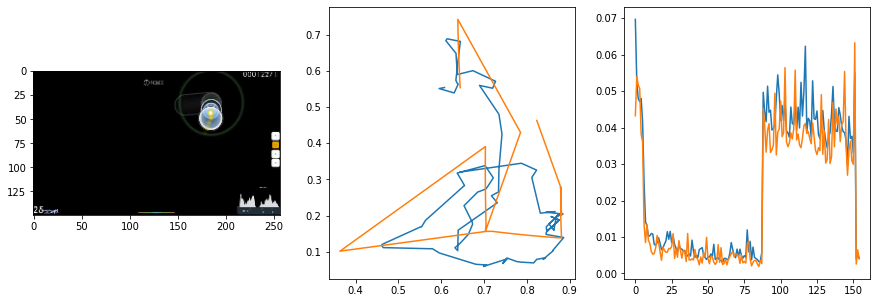

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.16it/s  0.0018                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

155 of 216
pred: 0.1768445372581482 0.4614579677581787
gt: 0.37570467591285706 0.32188063859939575
(106, 55)


<Figure size 1080x360 with 0 Axes>

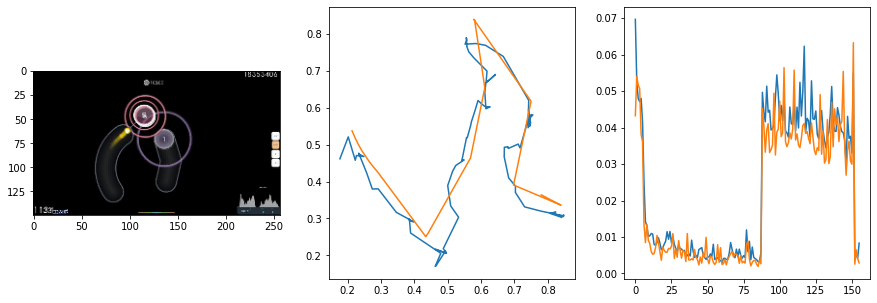

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:03<00:00:00  6.27it/s  0.0018                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

156 of 216
pred: 0.4486955404281616 0.22920385003089905
gt: 0.5944084525108337 0.3132023811340332
(140, 54)


<Figure size 1080x360 with 0 Axes>

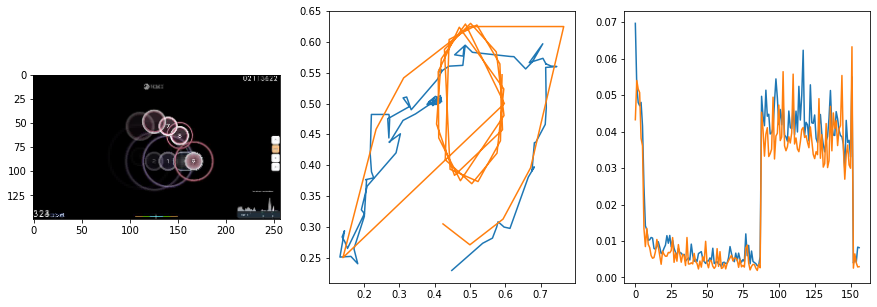

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.14it/s  0.0076                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

157 of 216
pred: 0.25983646512031555 0.5936800837516785
gt: 0.2890625 0.7604166865348816
(92, 106)


<Figure size 1080x360 with 0 Axes>

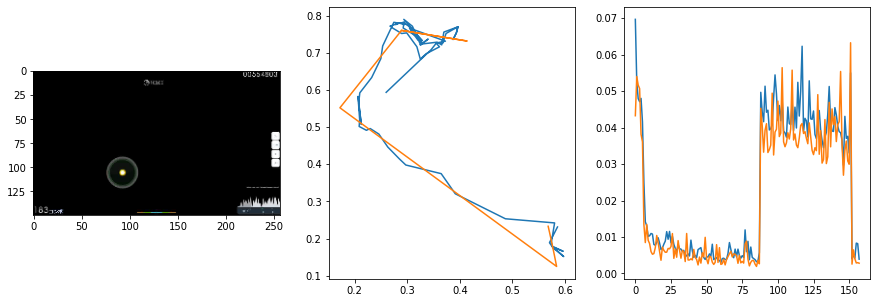

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.16it/s  0.0109                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

158 of 216
pred: 0.213777095079422 0.5557944774627686
gt: 0.14733746647834778 0.6498144268989563
(70, 93)


<Figure size 1080x360 with 0 Axes>

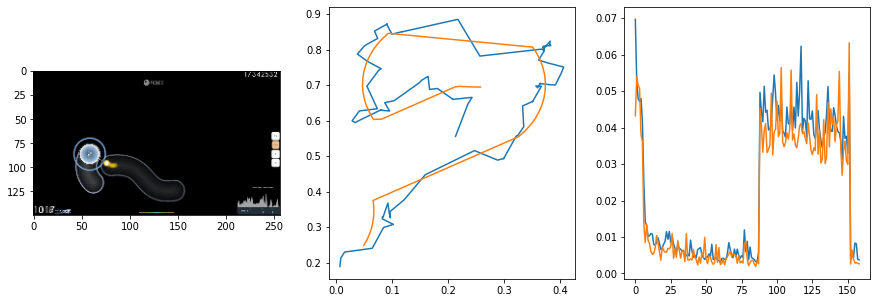

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.97it/s  0.0017                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

159 of 216
pred: 0.5035040378570557 0.40570202469825745
gt: 0.6957616209983826 0.652571439743042
(155, 93)


<Figure size 1080x360 with 0 Axes>

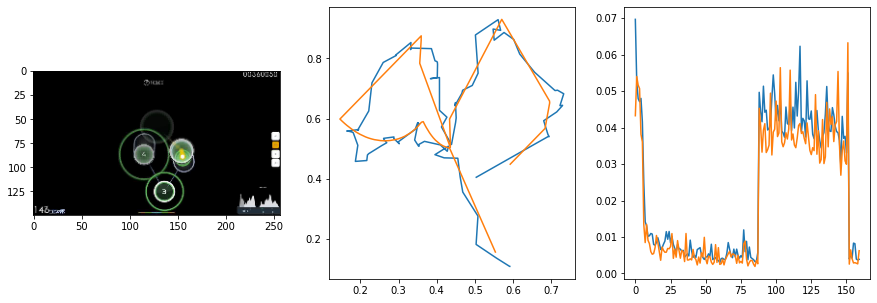

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.97it/s  0.0021                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

160 of 216
pred: 0.04879298433661461 0.6681117415428162
gt: 0.29966381192207336 0.8151550889015198
(94, 112)


<Figure size 1080x360 with 0 Axes>

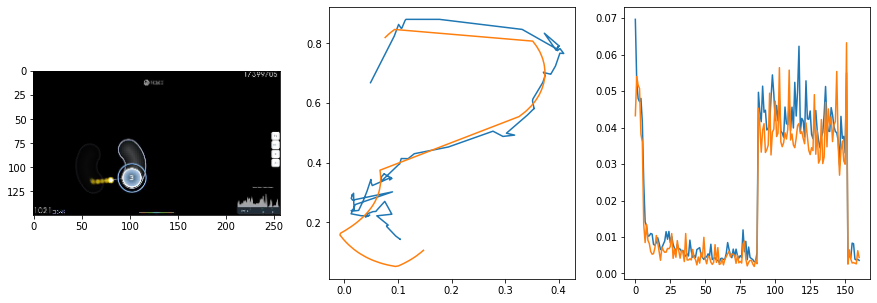

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.96it/s  0.0017                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

161 of 216
pred: 0.5307675004005432 0.7119060158729553
gt: 0.4444740414619446 0.9675447344779968
(116, 130)


<Figure size 1080x360 with 0 Axes>

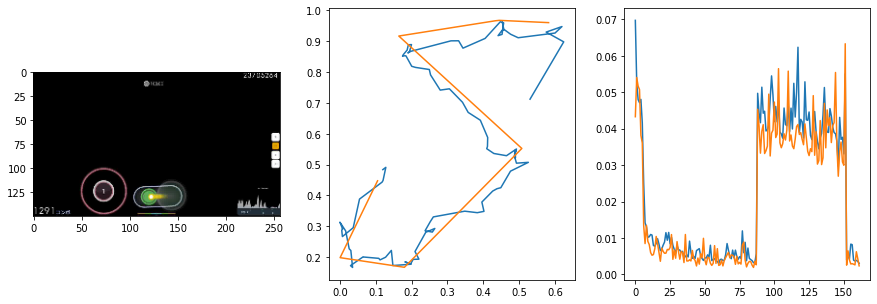

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.02it/s  0.0083                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

162 of 216
pred: 0.666201114654541 0.5933434963226318
gt: 0.8440473675727844 0.4137828052043915
(178, 66)


<Figure size 1080x360 with 0 Axes>

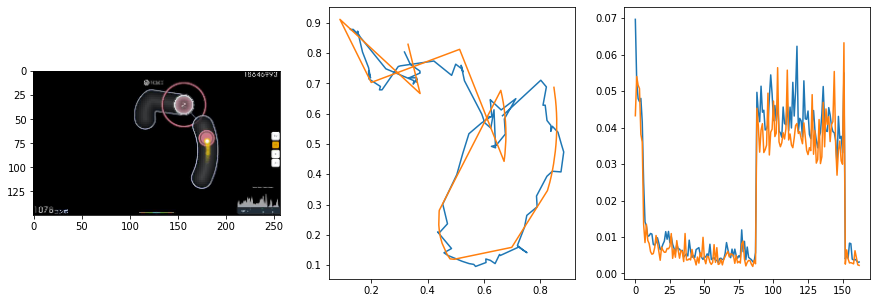

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0027                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

163 of 216
pred: 0.3618946969509125 0.5928679704666138
gt: 0.45175701379776 0.7571737170219421
(118, 106)


<Figure size 1080x360 with 0 Axes>

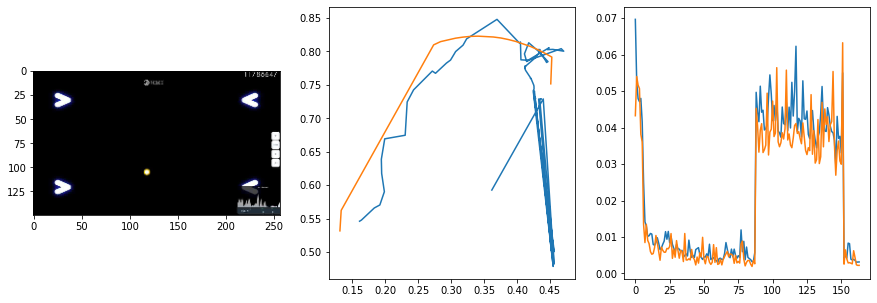

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.96it/s  0.0011                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

164 of 216
pred: 0.6262589693069458 0.4393390119075775
gt: 0.6419771909713745 0.6850962042808533
(147, 97)


<Figure size 1080x360 with 0 Axes>

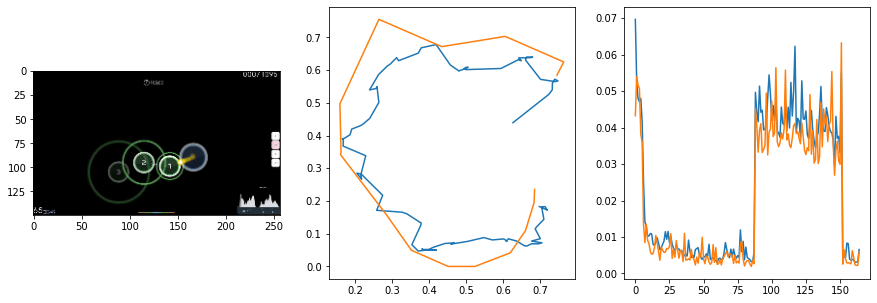

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0016                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

165 of 216
pred: 0.29710832238197327 0.6139318943023682
gt: 0.568359375 0.0651041641831398
(136, 25)


<Figure size 1080x360 with 0 Axes>

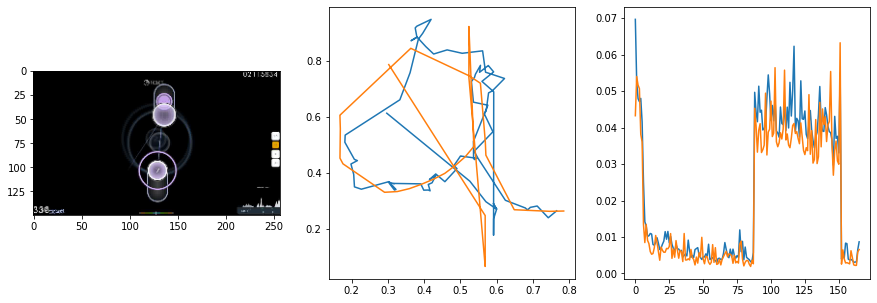

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.00it/s  0.0018                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

166 of 216
pred: 0.45699992775917053 0.3719291687011719
gt: 0.6792402863502502 0.49041473865509033
(153, 75)


<Figure size 1080x360 with 0 Axes>

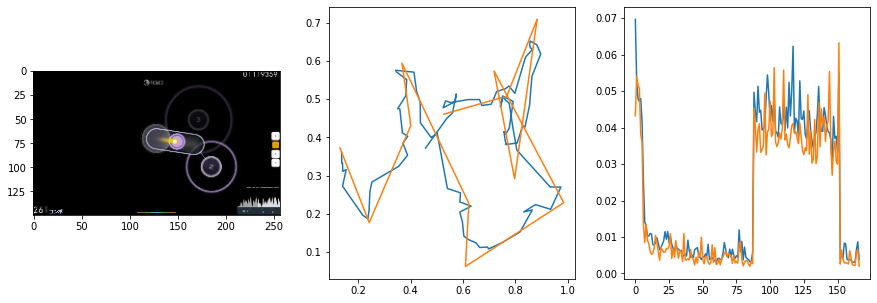

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.00it/s  0.0020                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

167 of 216
pred: 0.15845634043216705 0.703545093536377
gt: 0.38429418206214905 0.9156189560890198
(107, 124)


<Figure size 1080x360 with 0 Axes>

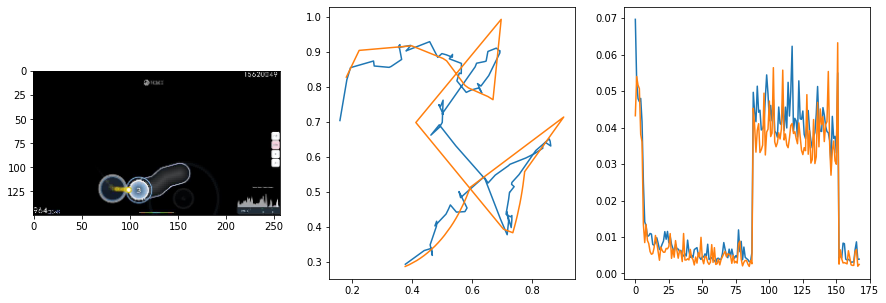

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0027                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

168 of 216
pred: 0.4873376488685608 0.5468235015869141
gt: 0.576171875 0.7020886540412903
(137, 99)


<Figure size 1080x360 with 0 Axes>

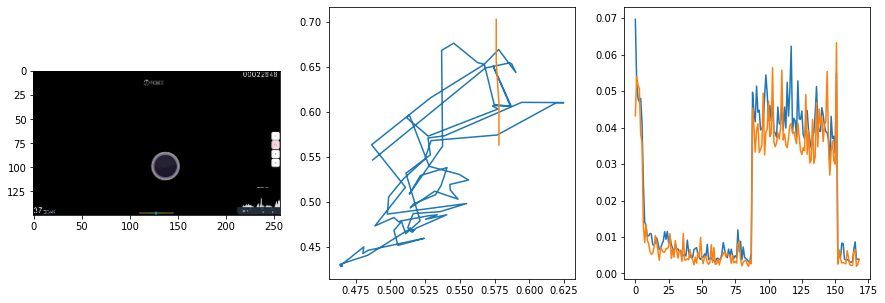

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.04it/s  0.0060                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

169 of 216
pred: 0.2021445333957672 0.5403783321380615
gt: 0.35282161831855774 0.4375198781490326
(102, 68)


<Figure size 1080x360 with 0 Axes>

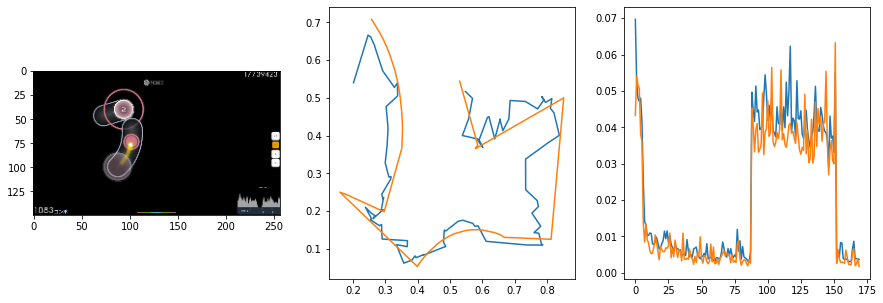

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.97it/s  0.0030                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

170 of 216
pred: 0.5731387138366699 0.044544100761413574
gt: 0.8582829833030701 0.2199968546628952
(181, 43)


<Figure size 1080x360 with 0 Axes>

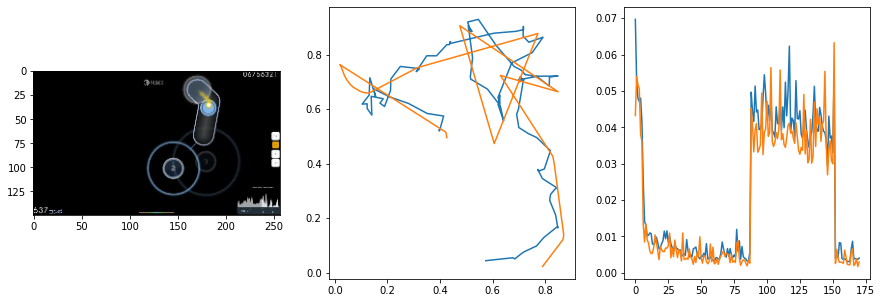

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0037                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

171 of 216
pred: 0.3505347967147827 0.4243053197860718
gt: 0.20008236169815063 0.7222383618354797
(79, 102)


<Figure size 1080x360 with 0 Axes>

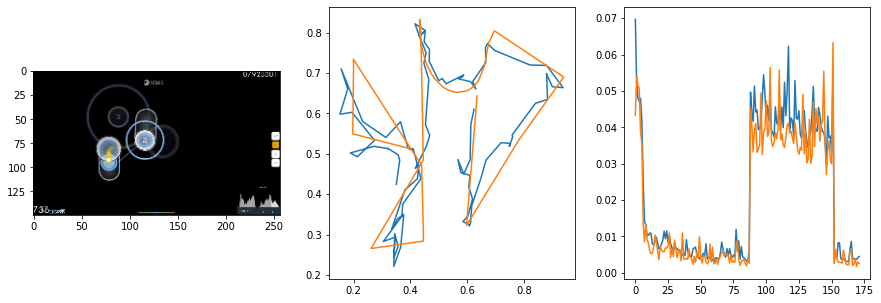

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.01it/s  0.0009                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

172 of 216
pred: 0.7457874417304993 0.2840224802494049
gt: 0.9145265817642212 0.32033827900886536
(189, 55)


<Figure size 1080x360 with 0 Axes>

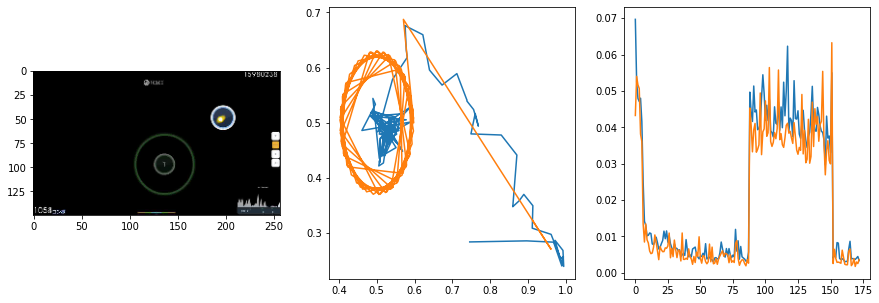

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.96it/s  0.0025                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

173 of 216
pred: 0.6451767086982727 0.4025568664073944
gt: 0.6834168434143066 0.4554883539676666
(153, 70)


<Figure size 1080x360 with 0 Axes>

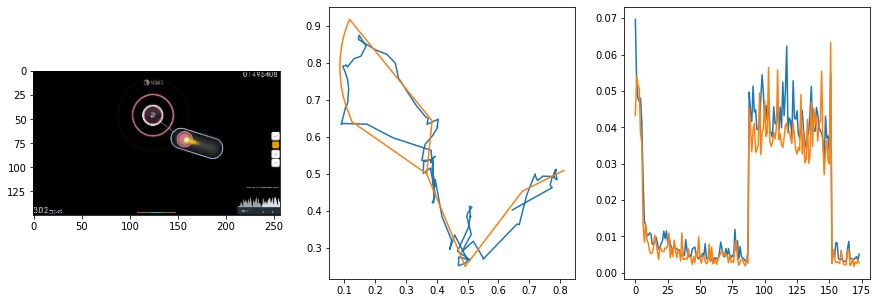

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0021                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

174 of 216
pred: 0.1610303372144699 0.5270488262176514
gt: 0.2895708382129669 0.9077839851379395
(92, 123)


<Figure size 1080x360 with 0 Axes>

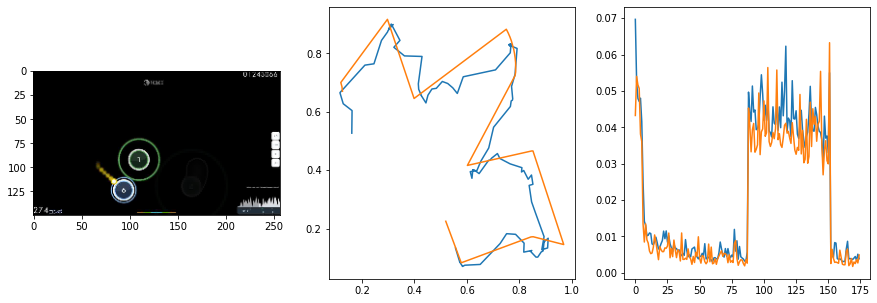

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.99it/s  0.0052                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

175 of 216
pred: 0.4425605535507202 0.5721039772033691
gt: 0.43484702706336975 0.8025383949279785
(115, 111)


<Figure size 1080x360 with 0 Axes>

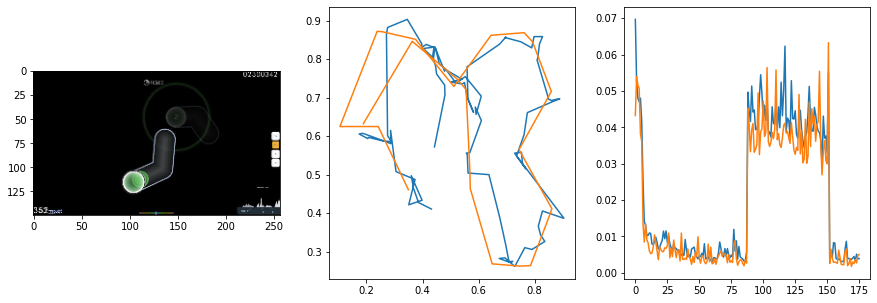

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0050                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

176 of 216
pred: 0.3425454795360565 0.36780738830566406
gt: 0.3757326900959015 0.2319251447916031
(106, 44)


<Figure size 1080x360 with 0 Axes>

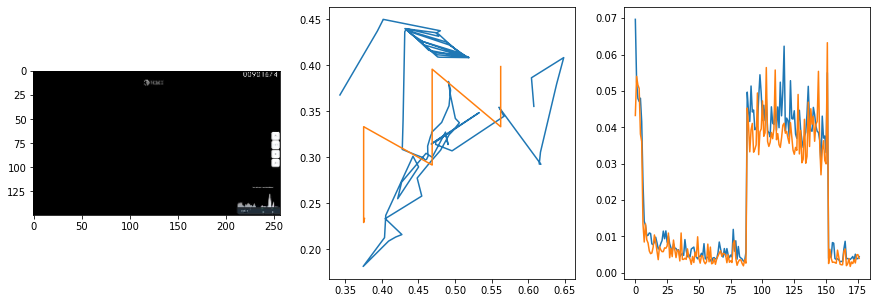

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0026                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

177 of 216
pred: 0.5689866542816162 0.3743775188922882
gt: 0.796875 0.6458333134651184
(171, 93)


<Figure size 1080x360 with 0 Axes>

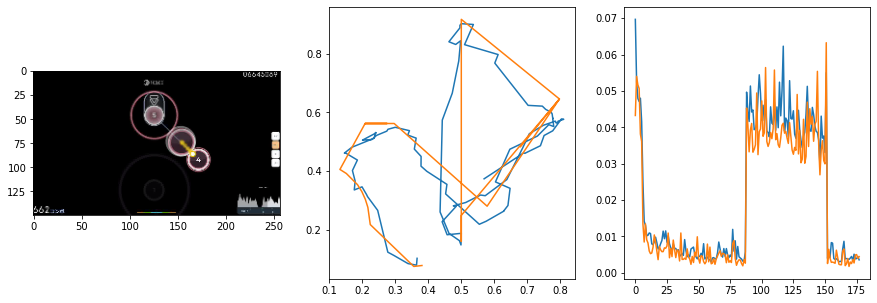

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.06it/s  0.0297                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

178 of 216
pred: 0.22119297087192535 0.4160415530204773
gt: 0.45417705178260803 0.5875166058540344
(118, 86)


<Figure size 1080x360 with 0 Axes>

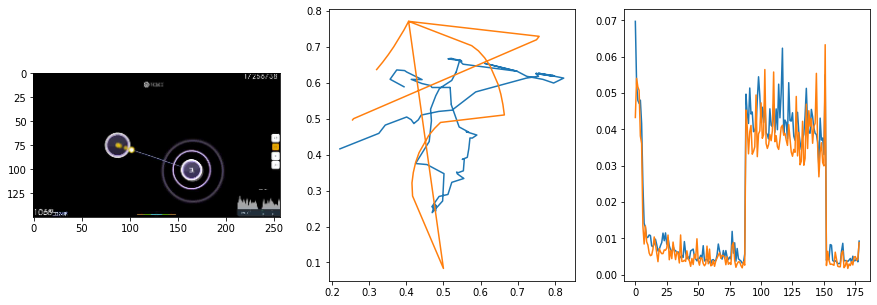

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.86it/s  0.0075                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

179 of 216
pred: 0.3369666635990143 0.46552449464797974
gt: 0.4436383843421936 0.3296130895614624
(116, 56)


<Figure size 1080x360 with 0 Axes>

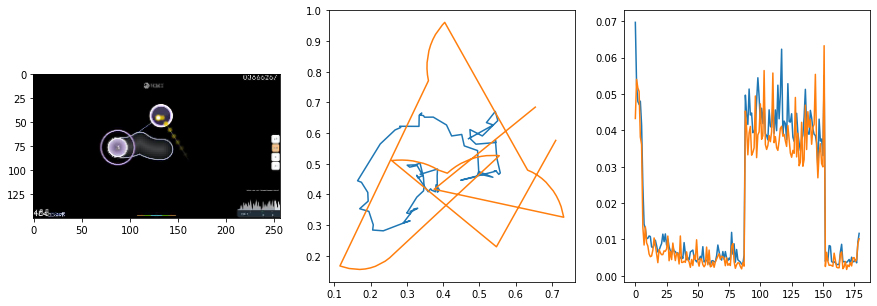

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.99it/s  0.0325                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

180 of 216
pred: 0.41543376445770264 0.31392866373062134
gt: 0.6304197907447815 0.20295405387878418
(145, 41)


<Figure size 1080x360 with 0 Axes>

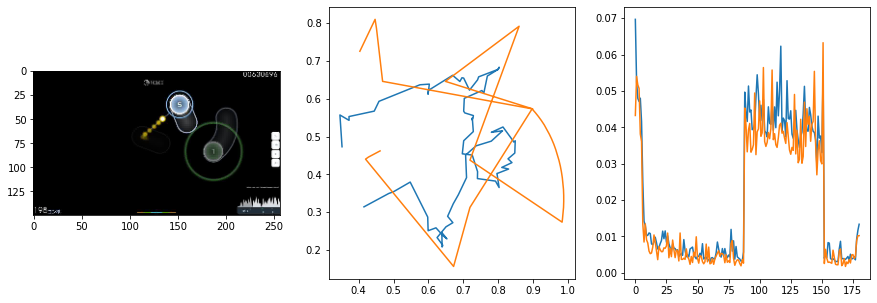

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0094                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

181 of 216
pred: 0.31429558992385864 0.5653783679008484
gt: 0.4501180946826935 0.6634446978569031
(117, 95)


<Figure size 1080x360 with 0 Axes>

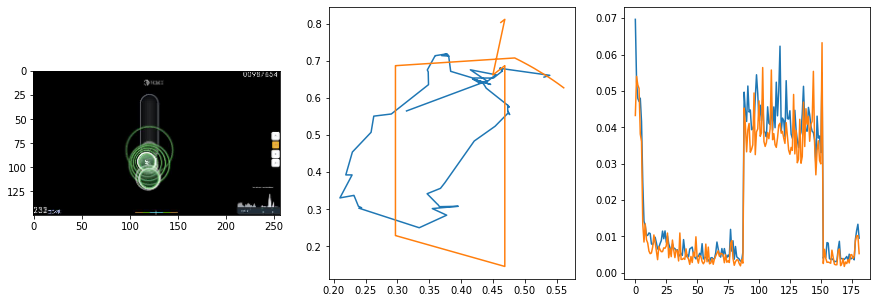

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.98it/s  0.0127                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

182 of 216
pred: 0.2972484230995178 0.4935709238052368
gt: 0.3988029360771179 0.4419959485530853
(109, 69)


<Figure size 1080x360 with 0 Axes>

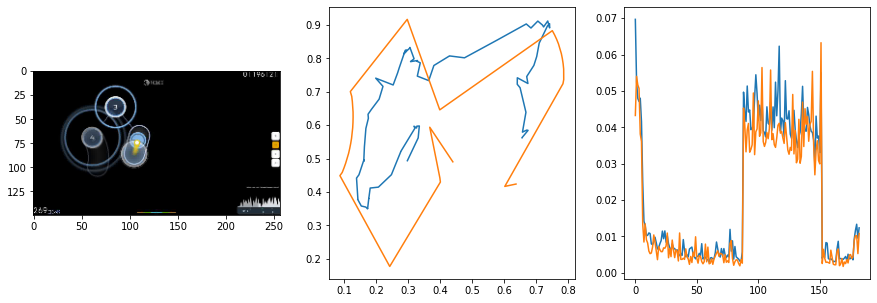

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.01it/s  0.0291                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

183 of 216
pred: 0.16868959367275238 0.5356193780899048
gt: 0.4799264967441559 0.7888875603675842
(122, 109)


<Figure size 1080x360 with 0 Axes>

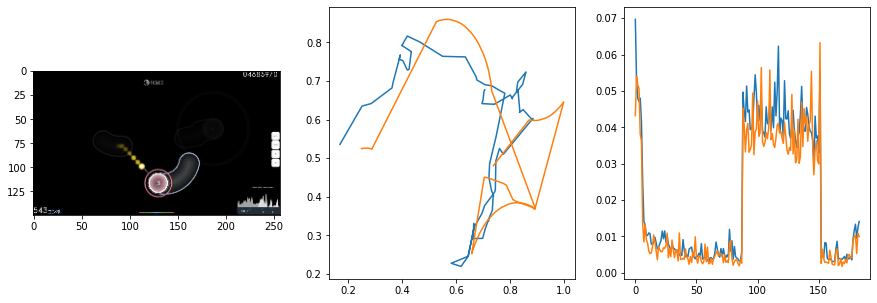

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.02it/s  0.0053                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

184 of 216
pred: 0.3568120002746582 0.49082887172698975
gt: 0.6860660314559937 0.40930578112602234
(154, 65)


<Figure size 1080x360 with 0 Axes>

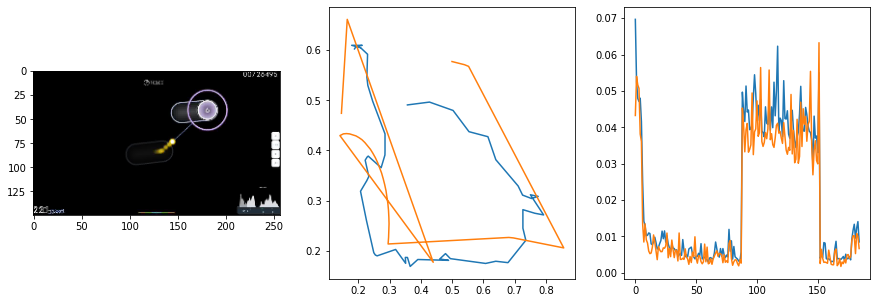

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.04it/s  0.0070                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

185 of 216
pred: 0.27474862337112427 0.6360102891921997
gt: 0.4293229281902313 0.5077584385871887
(114, 77)


<Figure size 1080x360 with 0 Axes>

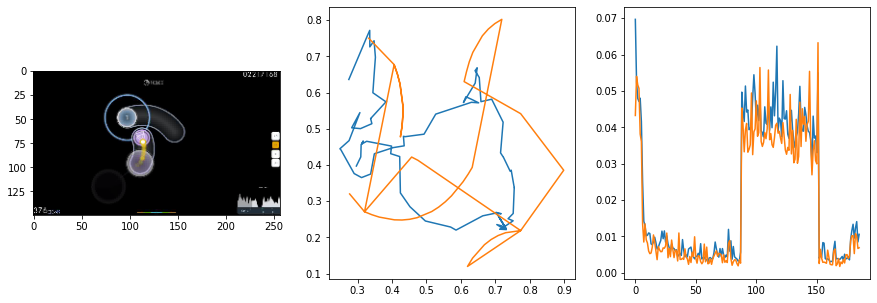

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.06it/s  0.0061                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

186 of 216
pred: 0.2892204225063324 0.13517184555530548
gt: 0.3989114463329315 0.07941480726003647
(109, 27)


<Figure size 1080x360 with 0 Axes>

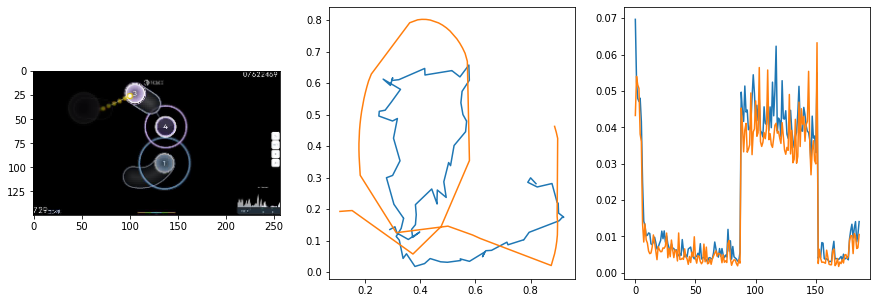

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.81it/s  0.0125                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

187 of 216
pred: 0.4028454124927521 0.6852025985717773
gt: 0.6451489329338074 0.7751736044883728
(148, 108)


<Figure size 1080x360 with 0 Axes>

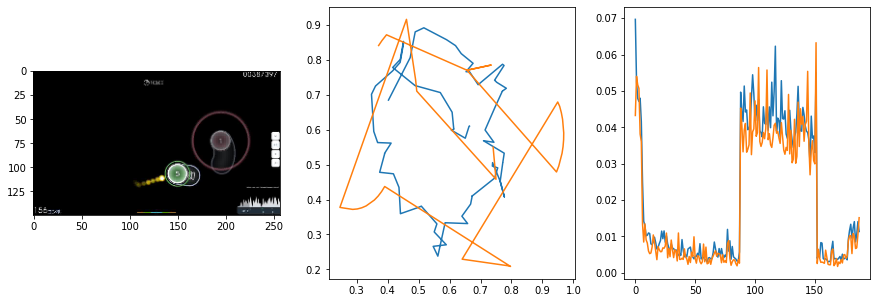

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.85it/s  0.0064                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

188 of 216
pred: 0.7337856292724609 0.6228198409080505
gt: 0.5144157409667969 0.7318636775016785
(127, 103)


<Figure size 1080x360 with 0 Axes>

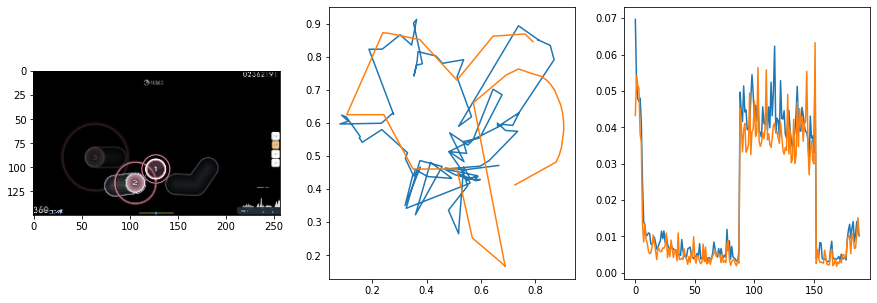

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.02it/s  0.0301                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

189 of 216
pred: 0.17658370733261108 0.39930713176727295
gt: 0.22569990158081055 0.6909389495849609
(83, 98)


<Figure size 1080x360 with 0 Axes>

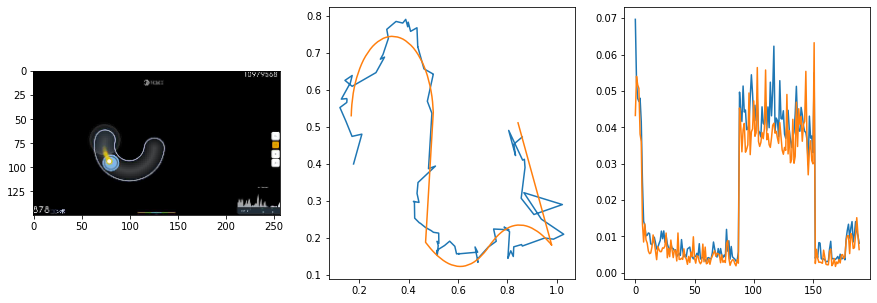

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.97it/s  0.0027                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

190 of 216
pred: 0.35975828766822815 0.06797643005847931
gt: 0.4974375367164612 0.13327722251415253
(125, 33)


<Figure size 1080x360 with 0 Axes>

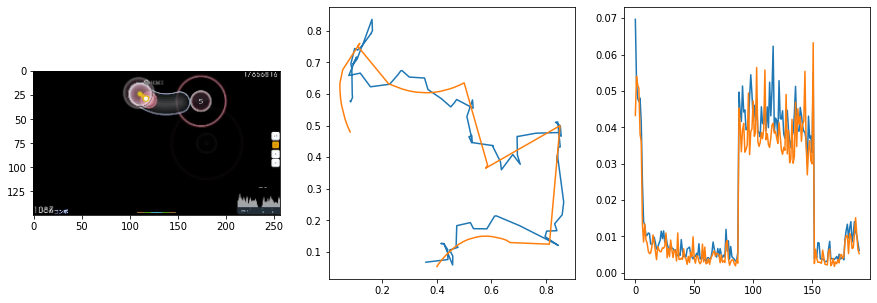

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.08it/s  0.0020                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

191 of 216
pred: 0.5034975409507751 0.21871253848075867
gt: 0.6925928592681885 0.19146309792995453
(155, 40)


<Figure size 1080x360 with 0 Axes>

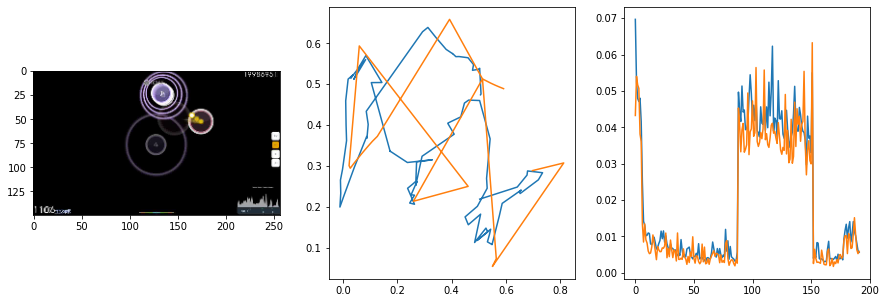

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0052                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

192 of 216
pred: 0.17282120883464813 0.4479265809059143
gt: 0.22180087864398956 0.8142707943916321
(82, 112)


<Figure size 1080x360 with 0 Axes>

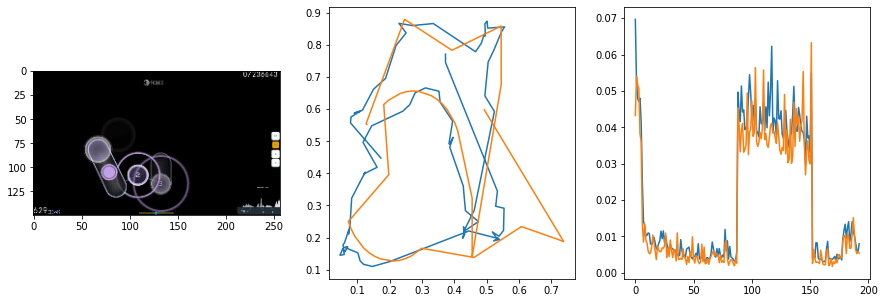

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.98it/s  0.0068                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

193 of 216
pred: 0.5977946519851685 0.6587284803390503
gt: 0.578125 0.875
(137, 119)


<Figure size 1080x360 with 0 Axes>

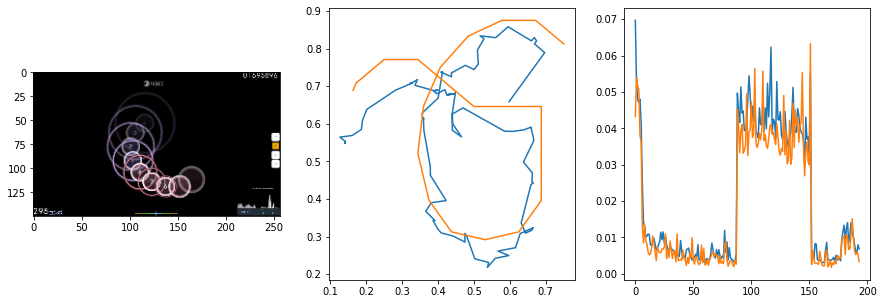

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.01it/s  0.0031                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

194 of 216
pred: 0.40496236085891724 0.3554012179374695
gt: 0.6682862639427185 0.4369781017303467
(151, 68)


<Figure size 1080x360 with 0 Axes>

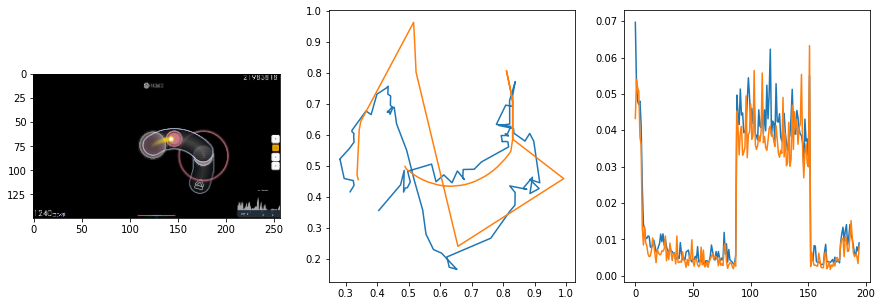

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.98it/s  0.0021                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

195 of 216
pred: 0.4524715840816498 0.10348673909902573
gt: 0.8973707556724548 0.11812129616737366
(187, 31)


<Figure size 1080x360 with 0 Axes>

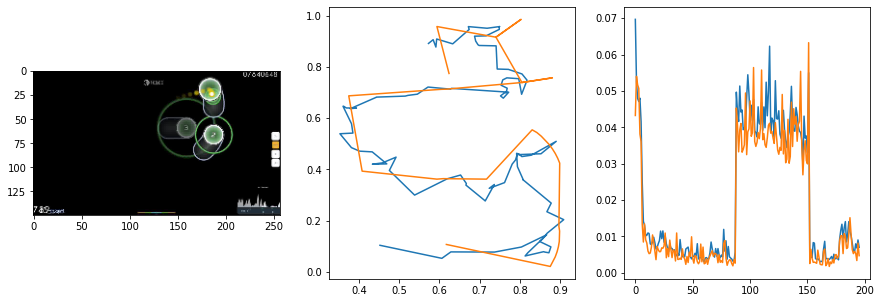

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.85it/s  0.0023                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

196 of 216
pred: 0.6478891372680664 0.07995045185089111
gt: 0.828125 0.4270833432674408
(176, 67)


<Figure size 1080x360 with 0 Axes>

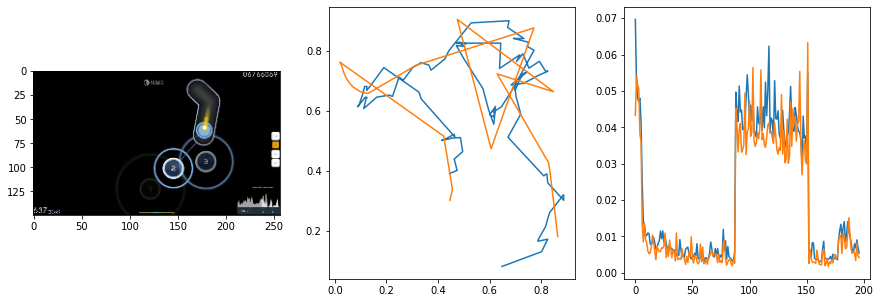

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  6.00it/s  0.0017                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

197 of 216
pred: 0.27493923902511597 0.7221187949180603
gt: 0.4053095281124115 0.8905205130577087
(110, 121)


<Figure size 1080x360 with 0 Axes>

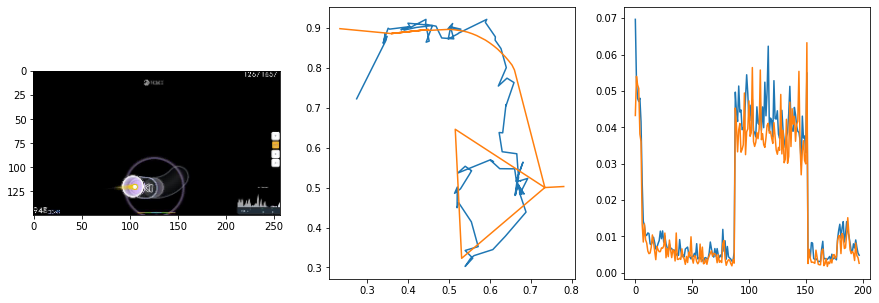

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.71it/s  0.0019                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

198 of 216
pred: 0.3345283567905426 0.4129687249660492
gt: 0.7601248025894165 0.4264248311519623
(165, 67)


<Figure size 1080x360 with 0 Axes>

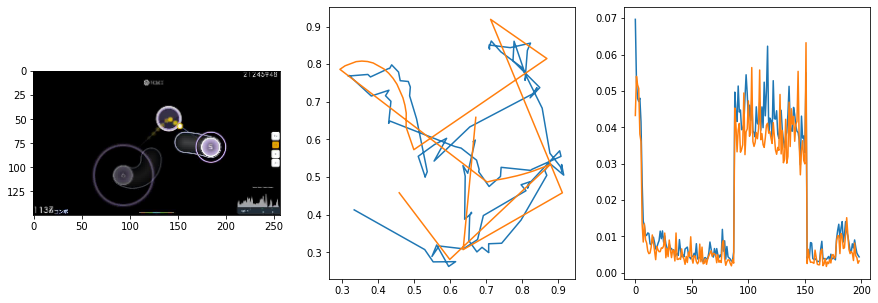

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.98it/s  0.0034                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

199 of 216
pred: 0.2507150173187256 0.43301627039909363
gt: 0.7260398864746094 0.4120294749736786
(160, 65)


<Figure size 1080x360 with 0 Axes>

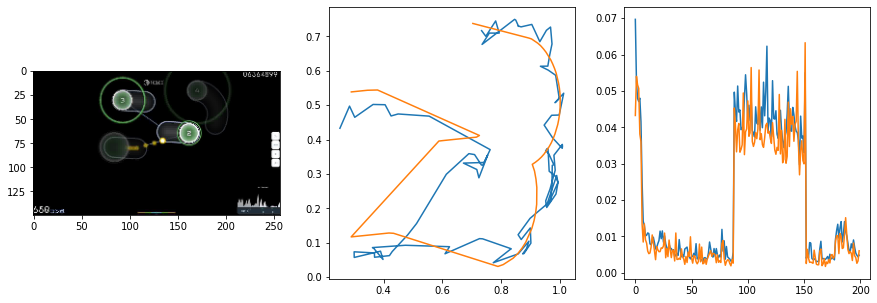

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.95it/s  0.0009                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

200 of 216
pred: 0.6715407967567444 0.4499112367630005
gt: 0.9822025299072266 0.9170332551002502
(200, 124)


<Figure size 1080x360 with 0 Axes>

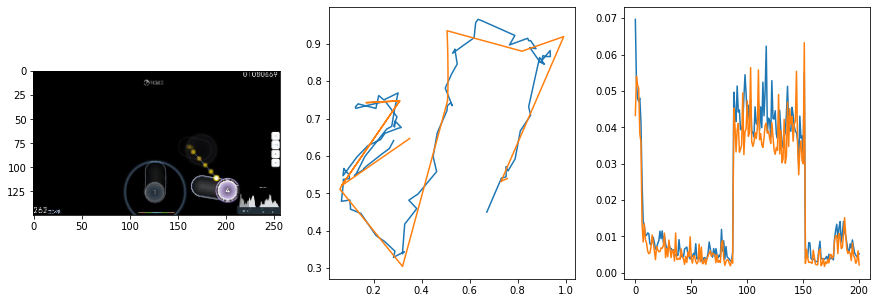

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0095                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

201 of 216
pred: 0.29765018820762634 0.12676265835762024
gt: 0.5634968876838684 0.10438945144414902
(135, 30)


<Figure size 1080x360 with 0 Axes>

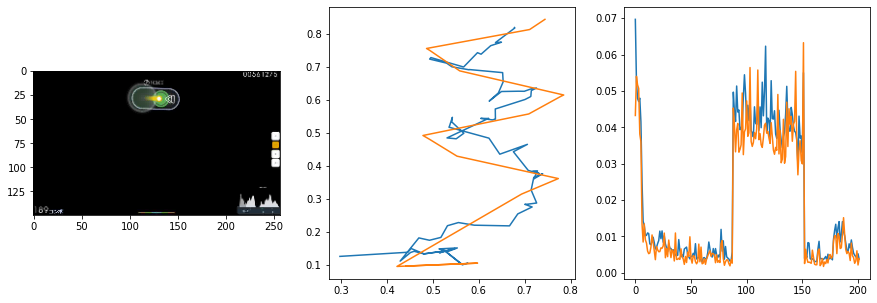

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0083                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

202 of 216
pred: 0.24643360078334808 0.530526876449585
gt: 0.3112770915031433 0.8911855816841125
(96, 121)


<Figure size 1080x360 with 0 Axes>

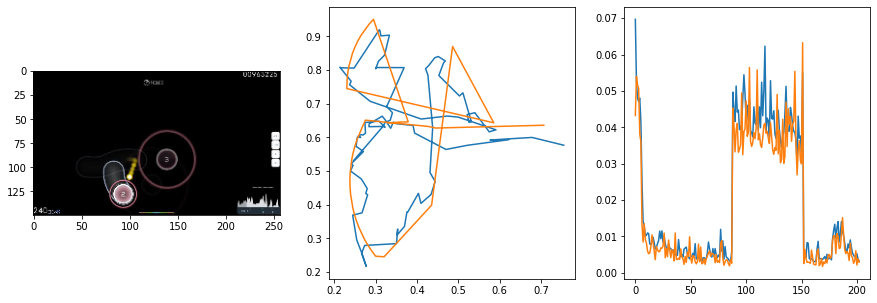

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.92it/s  0.0032                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

203 of 216
pred: 0.6872861385345459 0.2799486517906189
gt: 0.7170252799987793 0.31048285961151123
(159, 54)


<Figure size 1080x360 with 0 Axes>

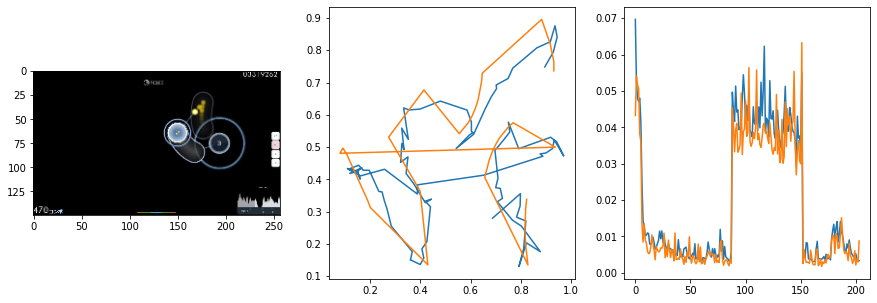

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0067                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

204 of 216
pred: 0.29322195053100586 0.6948510408401489
gt: 0.5228918790817261 0.8067750334739685
(129, 111)


<Figure size 1080x360 with 0 Axes>

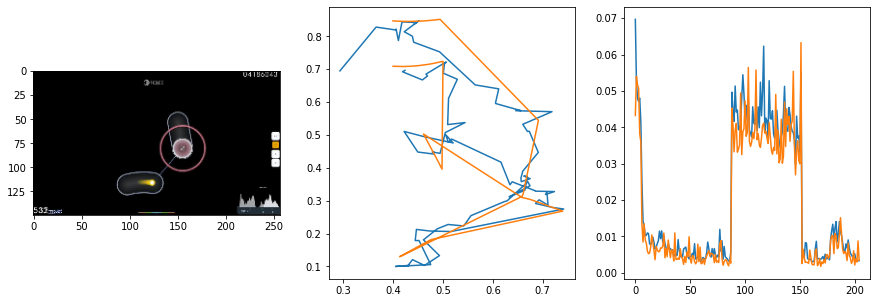

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.96it/s  0.0008                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

205 of 216
pred: 0.48389849066734314 0.5856544375419617
gt: 0.5703125 0.6875
(136, 97)


<Figure size 1080x360 with 0 Axes>

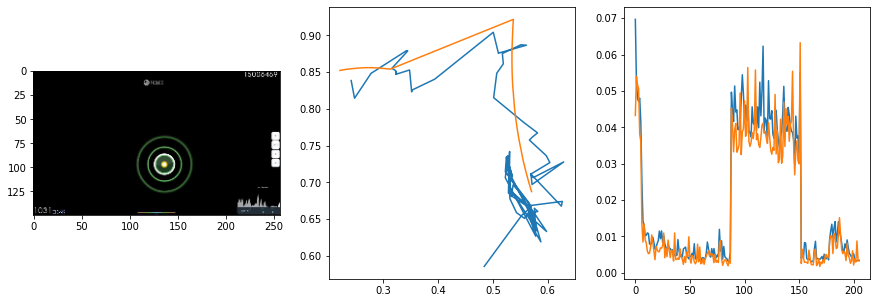

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0013                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

206 of 216
pred: 0.3943162262439728 0.4903756082057953
gt: 0.5346648097038269 0.7082495093345642
(130, 100)


<Figure size 1080x360 with 0 Axes>

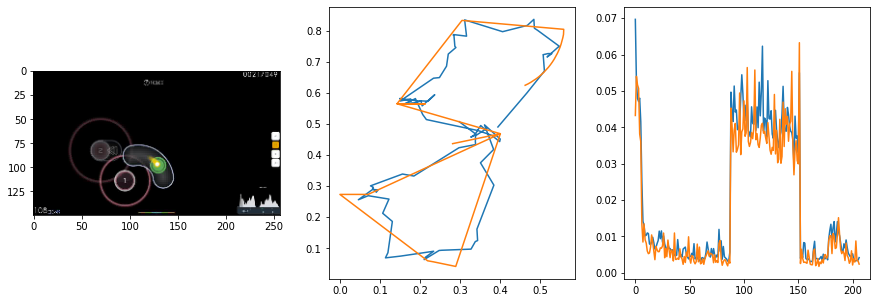

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.99it/s  0.0010                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

207 of 216
pred: 0.38847464323043823 0.5826646685600281
gt: 0.4510582983493805 0.7395555377006531
(117, 104)


<Figure size 1080x360 with 0 Axes>

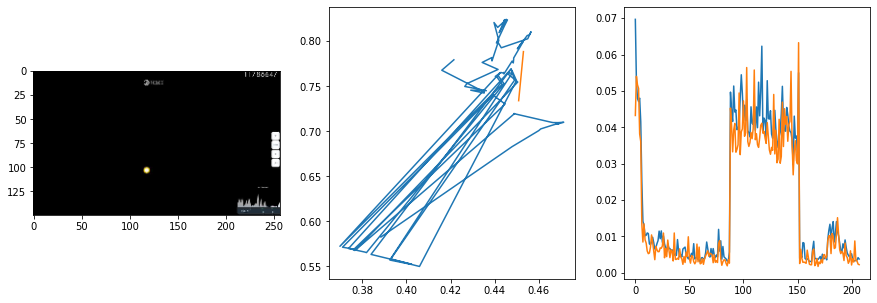

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0013                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

208 of 216
pred: 0.39705556631088257 0.4839848279953003
gt: 0.44614535570144653 0.6156780123710632
(117, 89)


<Figure size 1080x360 with 0 Axes>

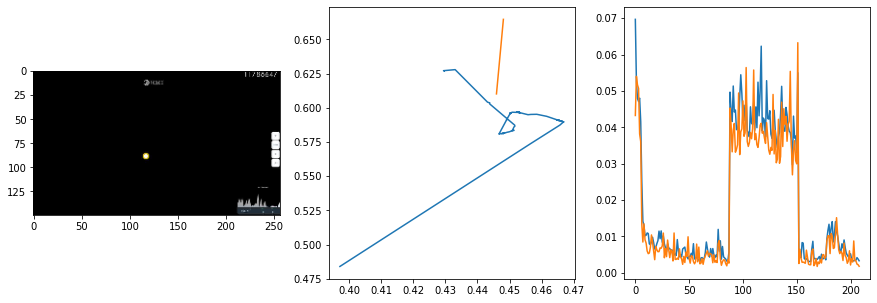

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0020                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

209 of 216
pred: 0.4900597929954529 0.34196656942367554
gt: 0.75 0.5989583134651184
(164, 87)


<Figure size 1080x360 with 0 Axes>

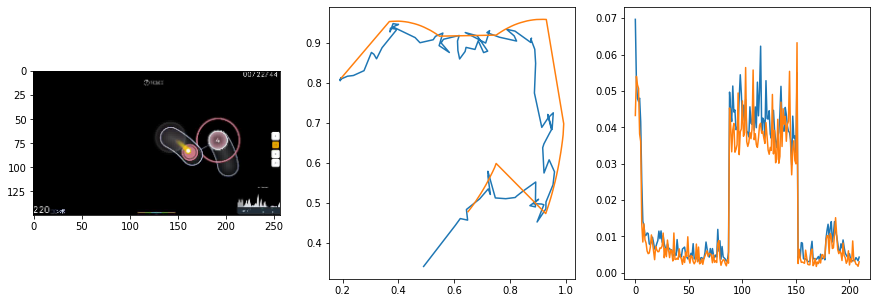

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.91it/s  0.0042                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

210 of 216
pred: 0.12401168048381805 0.16042648255825043
gt: 0.21278396248817444 0.3493727445602417
(80, 58)


<Figure size 1080x360 with 0 Axes>

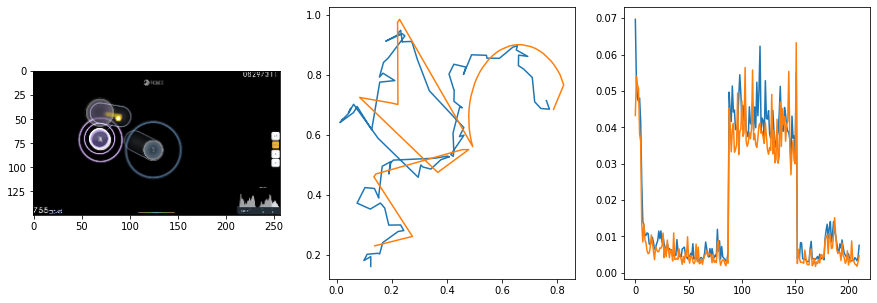

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.93it/s  0.0022                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

211 of 216
pred: 0.1972961276769638 0.6385778188705444
gt: 0.09342170506715775 0.7456923127174377
(62, 104)


<Figure size 1080x360 with 0 Axes>

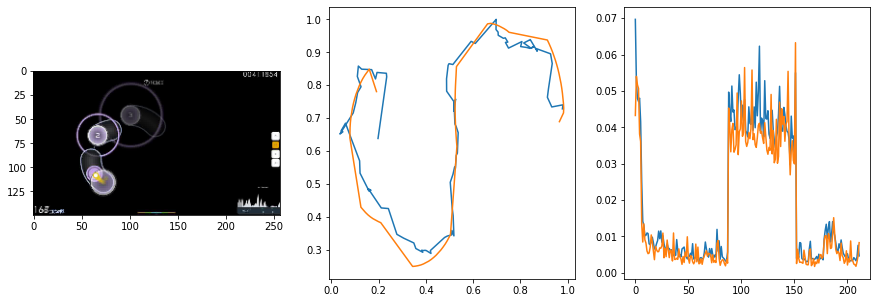

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.87it/s  0.0103                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

212 of 216
pred: 0.23039868474006653 0.49453622102737427
gt: 0.2277187556028366 0.6343541741371155
(83, 91)


<Figure size 1080x360 with 0 Axes>

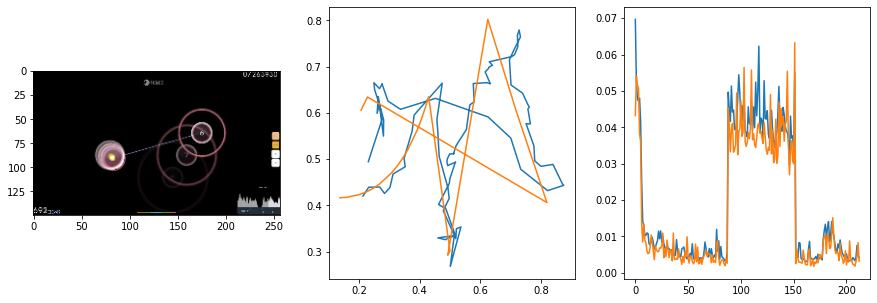

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.90it/s  0.0018                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

213 of 216
pred: 0.4701612591743469 0.17942634224891663
gt: 0.59375 0.20942485332489014
(140, 42)


<Figure size 1080x360 with 0 Axes>

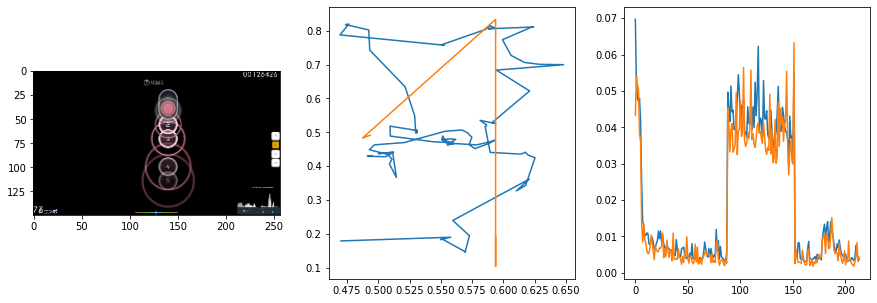

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.85it/s  0.0043                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

214 of 216
pred: 0.4064498245716095 0.36852213740348816
gt: 0.37682467699050903 0.23603619635105133
(106, 45)


<Figure size 1080x360 with 0 Axes>

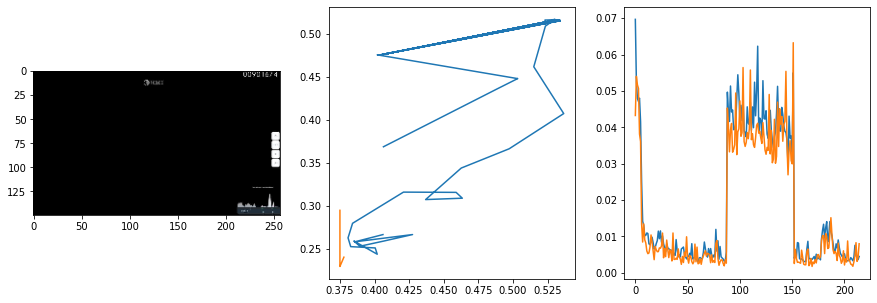

 Iters    Elapsed Time      Speed     loss                                      
 25/25  00:00:04<00:00:00  5.79it/s  0.0019                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

215 of 216
pred: 0.6437310576438904 0.18370892107486725
gt: 0.9071768522262573 0.5506494045257568
(188, 82)


<Figure size 1080x360 with 0 Axes>

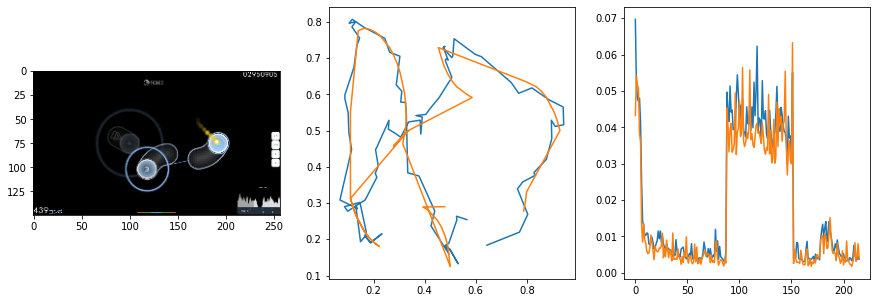

363.97330951690674 secs


In [73]:
start = time.time()

lamb = 1
epochs = 64
trainVN()

end = time.time()
print(end - start, 'secs')

In [21]:
torch.save(vn.state_dict(), model_path + str(epoch_cum) + '.pt')

# Test Model

In [22]:
import os
import cv2
import torch
import torchvision.transforms as transforms

In [25]:
vn.load_state_dict(torch.load(model_path + str(88) + '.pt'))

<All keys matched successfully>

In [23]:
#osud = '../ex/beatmaps/567301 LamazeP - Spam Jack'
#osuf = 'LamazeP - Spam Jack (OsuToothbrush) [SPAM].osu'
#osud = '../ex/beatmaps/252981 DJ Okawari - Flower Dance (Short Ver)'
#osuf = 'DJ Okawari - Flower Dance (Short Ver.) (-Hanayuki-) [Relax].osu'
#osud = '../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku'
#osuf = 'sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-\'s Hard].osu'
#osud = '../demo/beatmaps/835194 Mili - Vulnerability'
#osuf = 'Mili_-_Vulnerability_IceKalt_Saturnalizes_Insane.osu'
#osud = '../demo/beatmaps/653534 Panda Eyes - ILY'
#osuf = 'Panda Eyes - ILY (M a r v o l l o) [Light Insane].osu'
osud = '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun'
osuf = 'Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu'

In [24]:
osr = OSR(osud, osuf, sample_rate=sample_rate, hop_size=hop_size, hidden=True, vtmp='../demo/vids/')

In [25]:
video_path = os.path.join('../demo/vids/', osuf + '.avi')

In [26]:
vn.to(device)
vn.init_hidden(1)
vn.eval()

VN(
  (convA1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convB1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB1): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convA2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convB2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (convA3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convB3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (maxPB3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (lstmA): LSTM(38912, 128, num_layers=2, batch_first=True)
  (linearA): Linear(in_features=128, out_features=32, bias=True)
  (linearB): Linear(in_features=32, out_features=2, bias=True)
)

In [27]:
transform = transforms.ToTensor()
frames = []
vc = cv2.VideoCapture(video_path)
p = []
while True:
    r, f = vc.read()
    if r is False:
        break
    f = cv2.resize(f, (0,0), fx=scale, fy=scale)
    F = transform(f).to(device)
    with torch.no_grad():
        P = vn(F.unsqueeze(0).unsqueeze(0))
    p.append(P.squeeze(0).squeeze(0).cpu().detach().numpy())

In [28]:
np.save('predVN.npy', p)

# Create Replay Video

In [29]:
from IPython.display import Video

In [30]:
eosud = osud.replace('/', '\/')

In [31]:
!sed -i "s/Beatmap path.*/Beatmap path\": \"$eosud\/$osuf\",/" data.json
!sed -i "s/Output path.*/Output path\": \"videoVN.mp4\",/" data.json

In [32]:
!python create_replayVN.py predVN.npy 50

2022-04-08 13:54:00,536:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-08 13:54:00,537:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'videoVN.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7fd05a4eb550>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb'

In [33]:
Video("videoVN.mp4")

In [68]:
!sed -i "s/Output path.*/Output path\": \"video.mp4\",/" data.json

In [69]:
!python create_replay.py predHN.npy predVN.npy 50 0.5

2022-04-08 06:04:21,443:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-08 06:04:21,443:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': '../demo/beatmaps/388036 Akiyama Uni - Kanpan Tasogare Shinbun/Akiyama Uni - Kanpan Tasogare Shinbun (09kami) [Insane].osu', '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'video.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7fb14d757640>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, 'text_y': 748, 'Font Size': 20, 'Size': 10, 'Rgb': 

In [70]:
Video("video.mp4")